<a href="https://colab.research.google.com/github/gitblankhub/Baf/blob/main/%EC%9A%B4%EB%8F%99%EB%8F%99%EC%9E%91%EB%B6%84%EB%A5%98/%5B%EC%B5%9C%EC%A2%85_goodperf%5DCNN_feature8_noaug.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
import os

drive.mount('/content/drive')
os.chdir('/content/drive/MyDrive/Colab Notebooks/운동동작분류')

Mounted at /content/drive


In [3]:
import numpy as np
import pandas as pd

train=pd.read_csv('train_features.csv')
test=pd.read_csv('test_features.csv')
train_labels=pd.read_csv('train_labels.csv')
submission=pd.read_csv('sample_submission.csv')

In [4]:
import matplotlib.pyplot as plt

# EDA

# 1. Exploration

In [ ]:
print(train['id'].nunique()) # id 3125개
print(test['id'].nunique()) # id 782개

print(train_labels['label'].nunique()) # 61개의 label-운동동작

3125
782
61


## 1-1 train

가속도에서는 센서에서 발생하는 가속도 측정, 자이로 센서는 센서에서 발생한 회전속도 측정.

In [ ]:
train.head()

,id,time,acc_x,acc_y,acc_z,gy_x,gy_y,gy_z
0,0,0,1.206087,-0.179371,-0.148447,-0.591608,-30.549010,-31.676112
1,0,1,1.287696,-0.198974,-0.182444,0.303100,-39.139103,-24.927216
2,0,2,1.304609,-0.195114,-0.253382,-3.617278,-44.122565,-25.019629
3,0,3,1.293095,-0.230366,-0.215210,2.712986,-53.597843,-27.454013
4,0,4,1.300887,-0.187757,-0.222523,4.286707,-57.906561,-27.961234


In [ ]:
train['id'].value_counts() # id(3125개) 별 600개의 time

id
0       600
2100    600
2078    600
2079    600
2080    600
       ... 
1044    600
1045    600
1046    600
1047    600
3124    600
Name: count, Length: 3125, dtype: int64

In [ ]:
train_labels

,id,label,label_desc
0,0,37,Shoulder Press (dumbbell)
1,1,26,Non-Exercise
2,2,3,Biceps Curl (band)
3,3,26,Non-Exercise
4,4,26,Non-Exercise
...,...,...,...
3120,3120,26,Non-Exercise
3121,3121,26,Non-Exercise
3122,3122,15,Dynamic Stretch (at your own pace)
3123,3123,26,Non-Exercise


In [ ]:
train_labels['label_desc'].unique()

array(['Shoulder Press (dumbbell)', 'Non-Exercise', 'Biceps Curl (band)',
       'Side Plank Right side', 'Plank', 'Chest Press (rack)',
       'Wall Squat', 'Russian Twist', 'Running (treadmill)',
       'Pushup (knee or foot variation)', 'Wall Ball',
       'Dynamic Stretch (at your own pace)',
       'Sit-up (hands positioned behind head)', 'Tap Right Device',
       'Static Stretch (at your own pace)', 'Device on Table',
       'Triceps extension (lying down)', 'Elliptical machine', 'Burpee',
       'Walking lunge', 'Lateral Raise', 'Jump Rope',
       'Triceps Kickback (knee on bench) (label spans both arms)',
       'Medicine Ball Slam',
       'Lunge (alternating both legs, weight optional)',
       'Fast Alternating Punches', 'Static stretch',
       'Squat Rack Shoulder Press', 'Overhead Triceps Extension',
       'Seated Back Fly', 'Bicep Curl', 'Side Plank Left side',
       'Dumbbell Squat (hands at side)', 'Dumbbell Deadlift Row',
       'Two-arm Dumbbell Curl (both arms, 

In [ ]:
train_labels[['label','label_desc']].value_counts()

label  label_desc                                  
26     Non-Exercise                                    1518
8      Device on Table                                   97
28     Plank                                             55
60     Wall Squat                                        48
18     Jump Rope                                         47
                                                       ... 
53     Triceps Kickback (knee on bench) (right arm)      13
13     Dumbbell Row (knee on bench) (right arm)          12
52     Triceps Kickback (knee on bench) (left arm)       12
12     Dumbbell Row (knee on bench) (left arm)           12
0      Arm Band Adjustment                               12
Name: count, Length: 61, dtype: int64

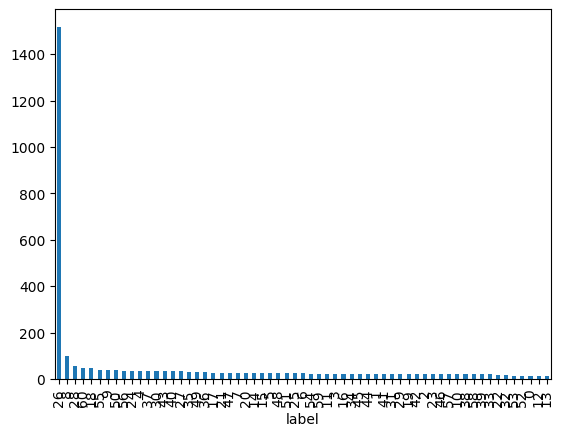

In [ ]:
train_labels['label'].value_counts().plot(kind='bar')
plt.show()

In [ ]:
print(train_labels[train_labels['label']==26].count())
print(train_labels[train_labels['label']!=26].count()) #Non-exercise 1607

id            1518
label         1518
label_desc    1518
dtype: int64
id            1607
label         1607
label_desc    1607
dtype: int64


In [ ]:
train[1:10000].describe() # acc, gy -> scaling 필요

,id,time,acc_x,acc_y,acc_z,gy_x,gy_y,gy_z
count,9999.000000,9999.000000,9999.000000,9999.000000,9999.000000,9999.000000,9999.000000,9999.000000
mean,7.840784,295.529553,-0.363908,-0.202727,0.156143,0.062406,1.252413,-2.254654
std,4.813823,172.378827,0.694499,0.421428,0.477490,57.997085,60.498744,54.587063
min,0.000000,0.000000,-5.334041,-4.020876,-3.413864,-769.076518,-492.405784,-981.088031
25%,4.000000,147.000000,-0.949066,-0.414402,-0.205040,-15.629359,-13.333125,-12.860224
50%,8.000000,294.000000,-0.537055,-0.194614,0.083320,-0.566870,0.348283,-1.668810
75%,12.000000,443.000000,0.006218,0.048832,0.540200,14.422714,17.083659,10.569764
max,16.000000,599.000000,4.425434,2.654832,2.678034,613.972600,1027.137542,916.508616


### plot

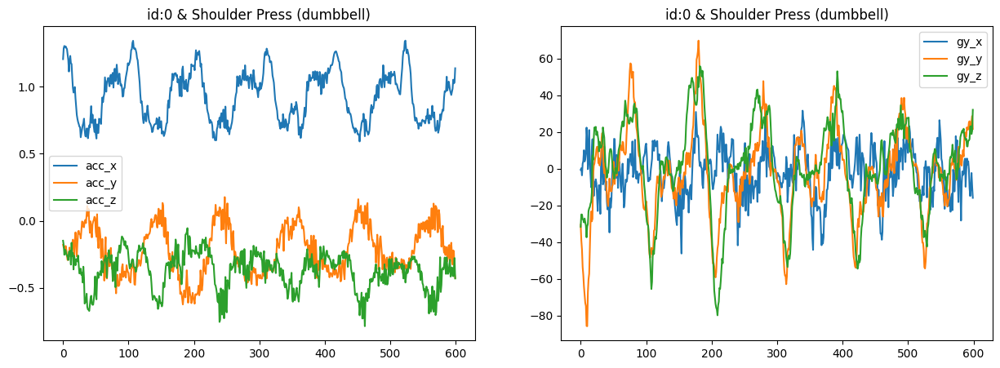

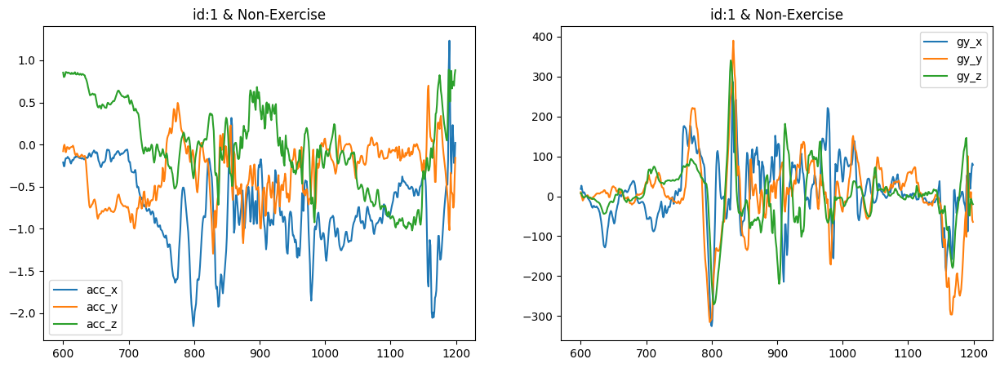

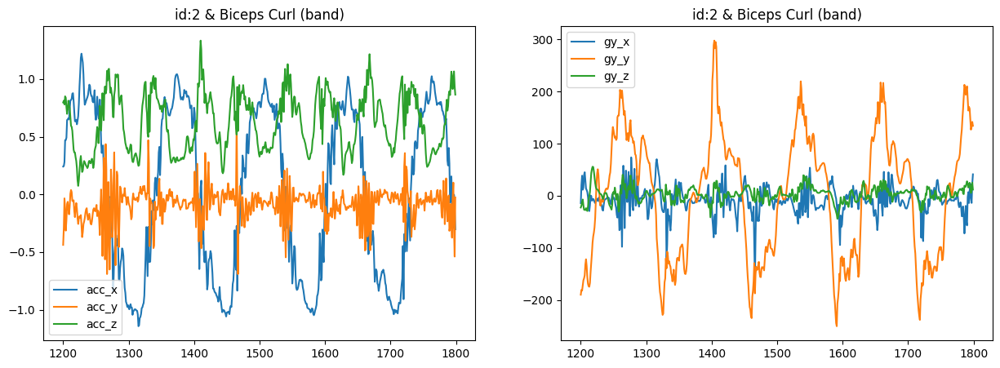

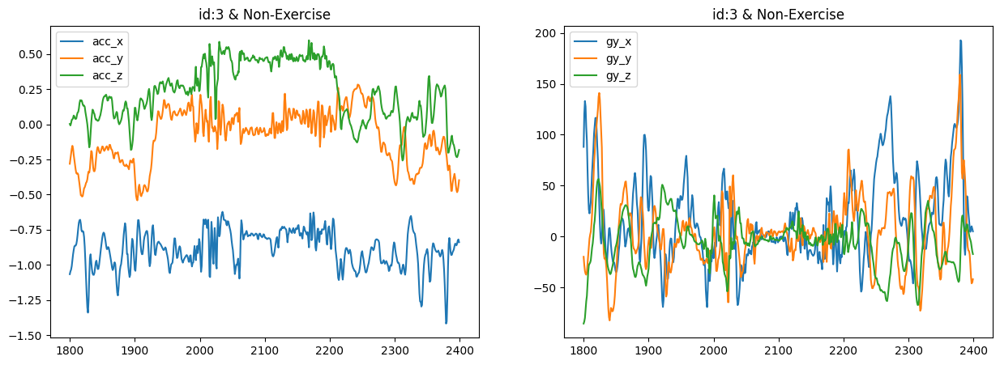

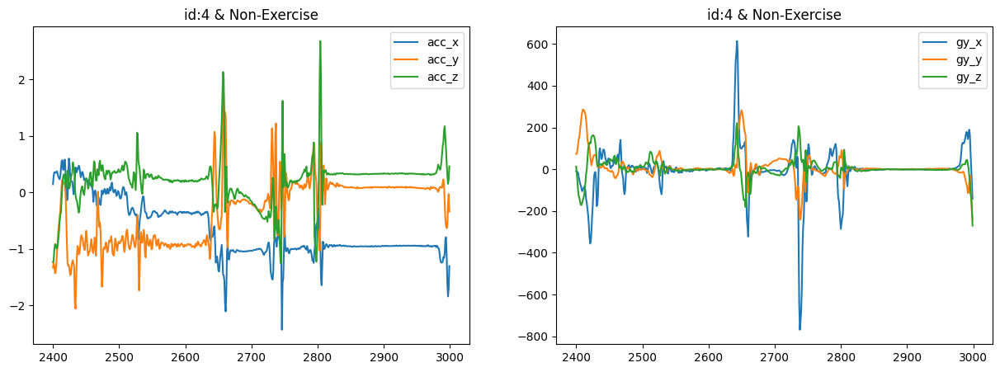

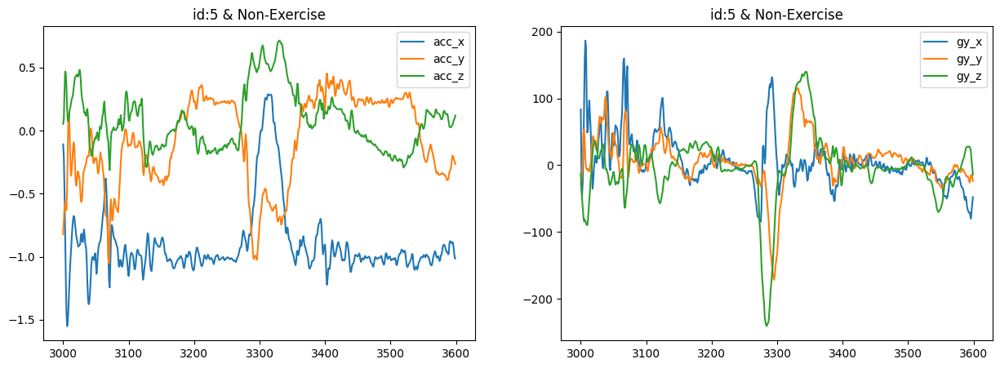

In [ ]:
#id 별 동작

for i in range(0,6,1):

  fig = plt.figure(figsize=(15,5))
  ax1 = fig.add_subplot(1,2,1)
  ax2 = fig.add_subplot(1,2,2)

  train[train['id']==i].iloc[:,2:5].plot(ax=ax1)
  ax1.set_title('id:{0} & {1}'.format(i, train_labels[train_labels['id']==i]['label_desc'].values[0]))

  train[train['id']==i].iloc[:,5:].plot(ax=ax2)
  ax2.set_title('id:{0} & {1}'.format(i, train_labels[train_labels['id']==i]['label_desc'].values[0]))

  plt.show()
  print()

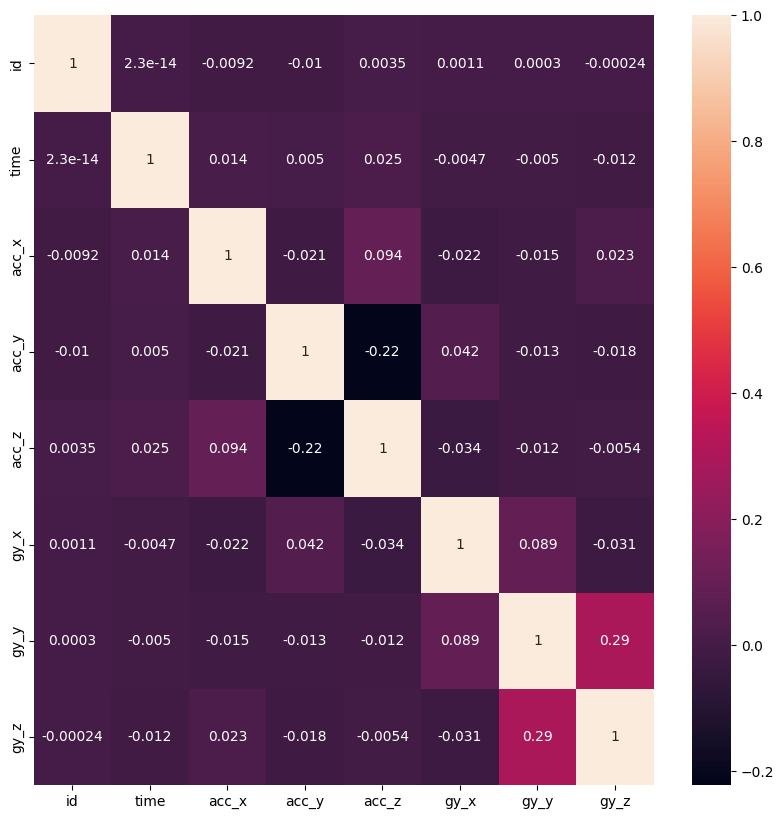

In [ ]:
import seaborn as sns

plt.figure(figsize=(10,10))

mask = np.zeros_like(train.corr(), dtype=bool)
mask[np.triu_indices_from(mask)] = False

sns.heatmap(train.corr(),annot=True)
plt.show()

### label 별

In [ ]:
train.columns

Index(['id', 'time', 'acc_x', 'acc_y', 'acc_z', 'gy_x', 'gy_y', 'gy_z'], dtype='object')

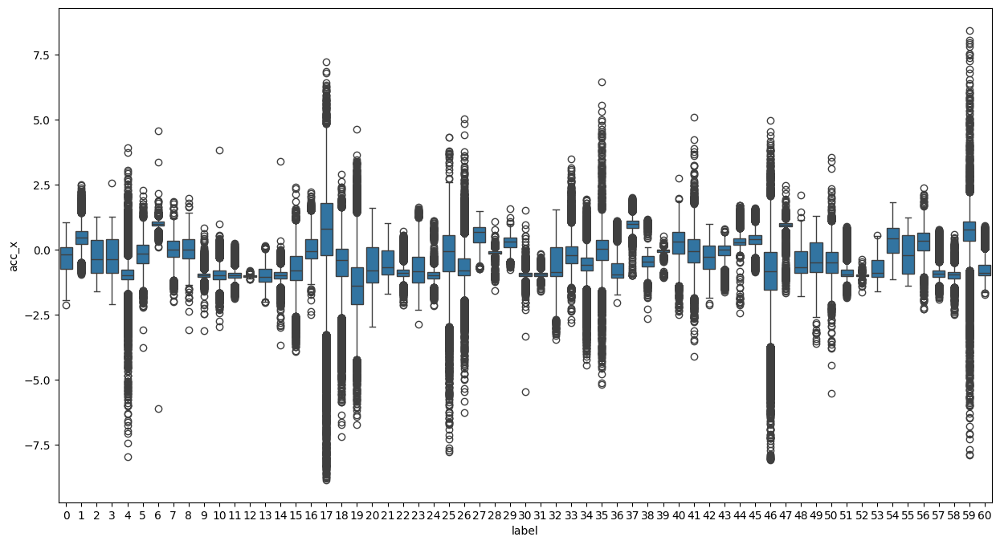

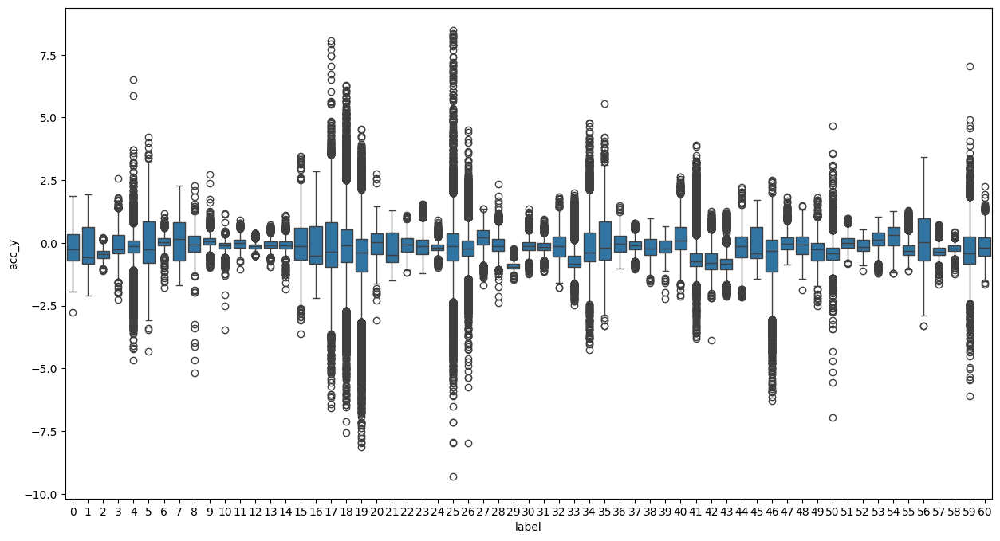

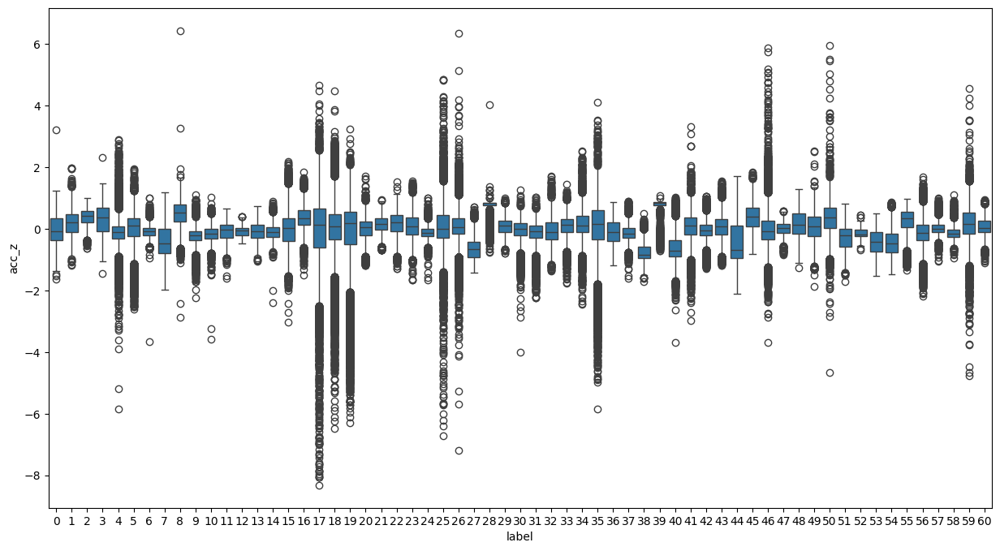

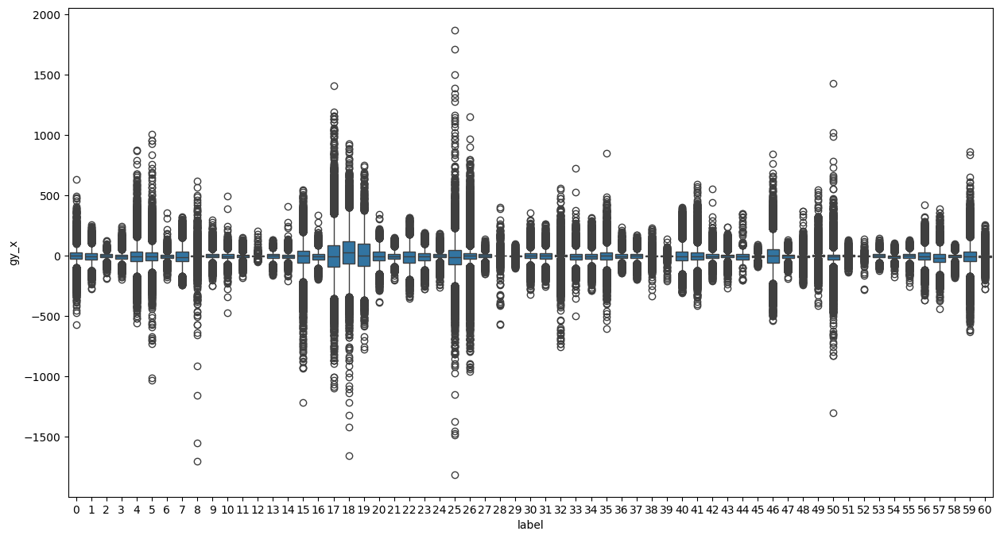

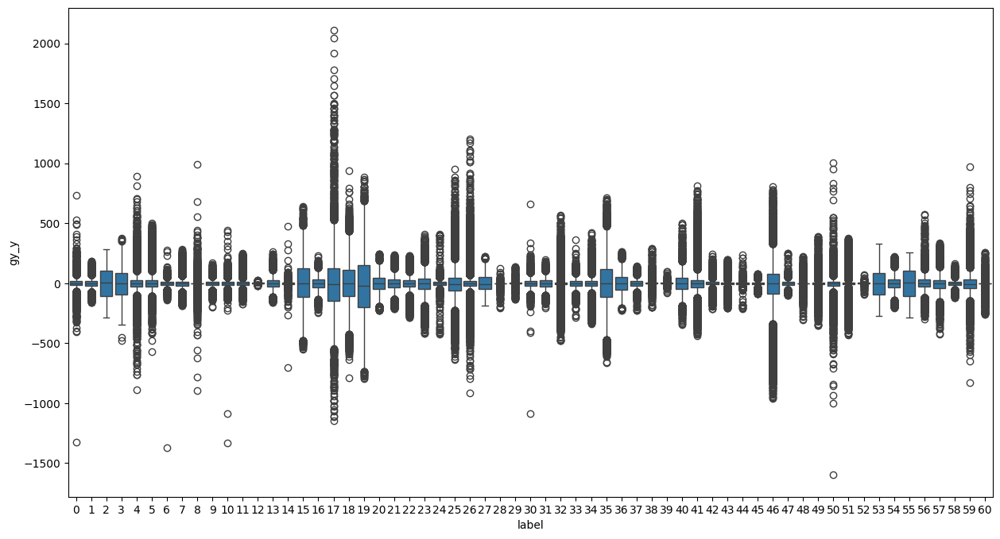

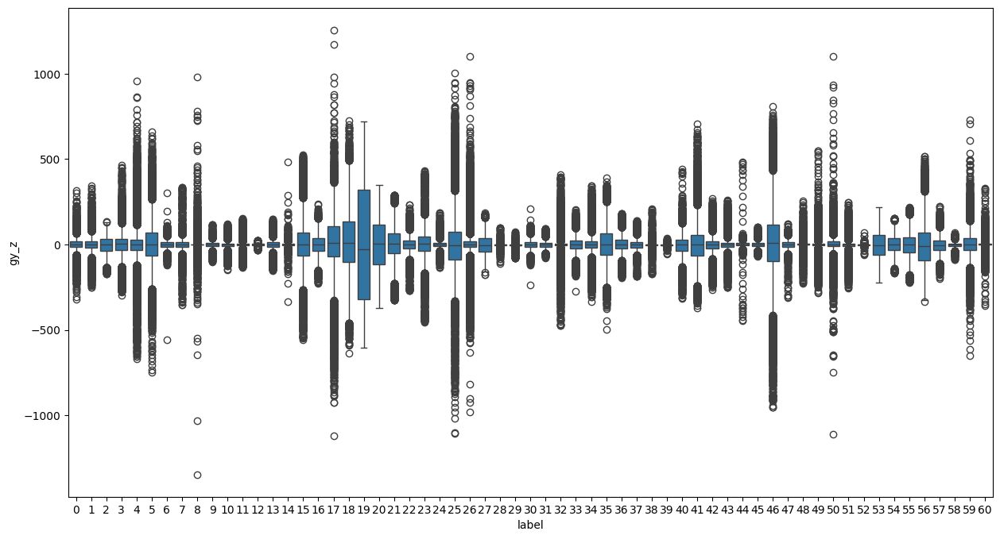

In [ ]:
# 각 label 별 x,y,z boxplot
import seaborn as sns

for i in ['acc_x', 'acc_y', 'acc_z', 'gy_x', 'gy_y', 'gy_z']:

  plt.figure(figsize = (15,8))

  sns.boxplot(x='label',

              y=i,

              data=pd.merge(train,train_labels))

  plt.show()

#### ex) label=1 :  Band Pull-Down Row

In [ ]:
train_labels[train_labels['label']==1].head()

,id,label,label_desc
121,121,1,Band Pull-Down Row
256,256,1,Band Pull-Down Row
362,362,1,Band Pull-Down Row
592,592,1,Band Pull-Down Row
840,840,1,Band Pull-Down Row


In [ ]:
label1=train_labels[train_labels['label']==1].index
label1

Index([ 121,  256,  362,  592,  840, 1008, 1011, 1189, 1396, 1420, 1533, 1578,
       1582, 1655, 1666, 1692, 1897, 2028, 2615, 2874, 2962],
      dtype='int64')

In [ ]:
df1 = pd.DataFrame(index=range(0,0), columns=['id', 'time', 'acc_x', 'acc_y', 'acc_z', 'gy_x', 'gy_y', 'gy_z'])
df1

,id,time,acc_x,acc_y,acc_z,gy_x,gy_y,gy_z


In [ ]:
for i in label1:
  df1= pd.concat([df1 , pd.DataFrame(train[train['id']==i])])

In [ ]:
df1

,id,time,acc_x,acc_y,acc_z,gy_x,gy_y,gy_z
72600,121,0,0.640598,-0.769199,0.636089,14.942746,32.510663,40.129182
72601,121,1,0.655655,-0.810453,0.599642,24.803914,22.240559,49.459860
72602,121,2,0.636468,-0.866491,0.621542,31.280562,20.172610,57.321120
72603,121,3,0.510725,-0.900305,0.633921,46.846085,25.326565,53.250757
72604,121,4,0.460270,-0.912396,0.560737,63.922149,46.618421,49.819528
...,...,...,...,...,...,...,...,...
1777795,2962,595,0.859059,-0.706300,0.184757,189.294862,30.120133,46.744970
1777796,2962,596,0.836479,-0.569470,0.273326,200.567124,54.751772,39.662804
1777797,2962,597,0.762923,-0.576776,0.354858,196.140947,72.874527,35.860743
1777798,2962,598,0.687885,-0.680597,0.367335,209.204177,84.062538,28.589794


In [ ]:
df1.describe()

,acc_x,acc_y,acc_z,gy_x,gy_y,gy_z
count,12600.000000,12600.000000,12600.000000,12600.000000,12600.000000,12600.000000
mean,0.478869,-0.180833,0.193860,-5.399275,-1.205324,1.576348
std,0.404640,0.783745,0.391957,53.373736,36.121074,47.560401
min,-0.948847,-2.102437,-1.193733,-273.135892,-162.759595,-251.070338
25%,0.231181,-0.822859,-0.102948,-34.688809,-18.644583,-18.520772
50%,0.463038,-0.563208,0.215518,-6.690916,-1.510710,1.531373
75%,0.710069,0.624594,0.480839,22.439625,16.407924,20.091339
max,2.489095,1.925207,1.975548,258.562595,184.763616,345.917620


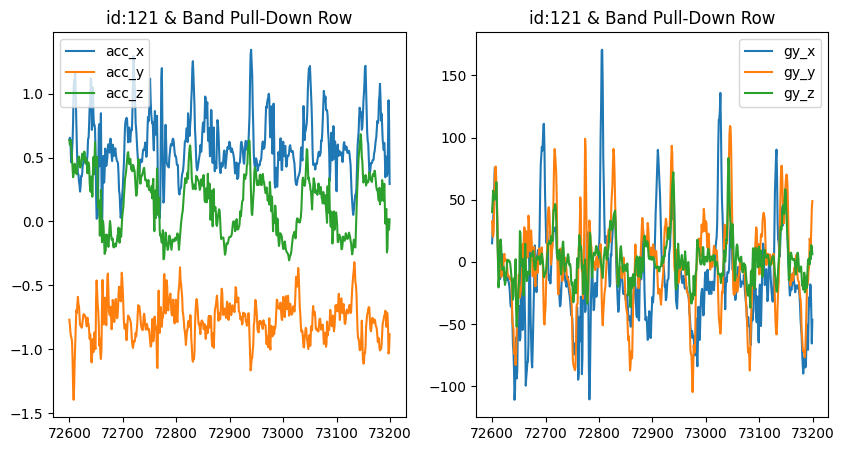

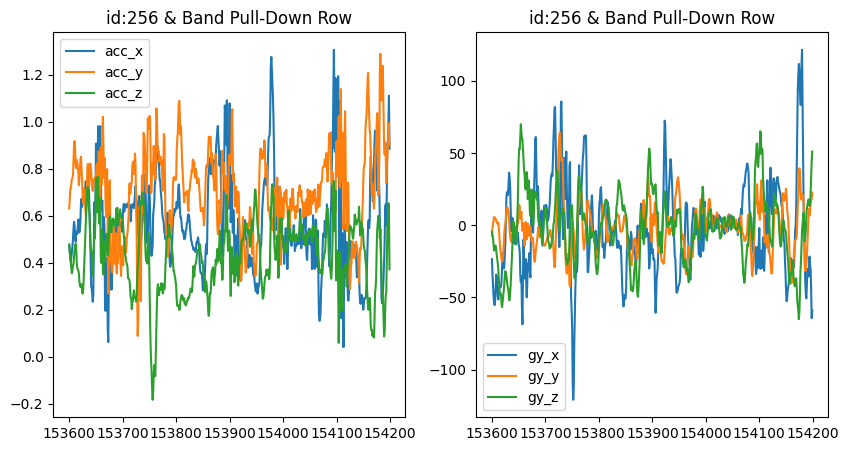

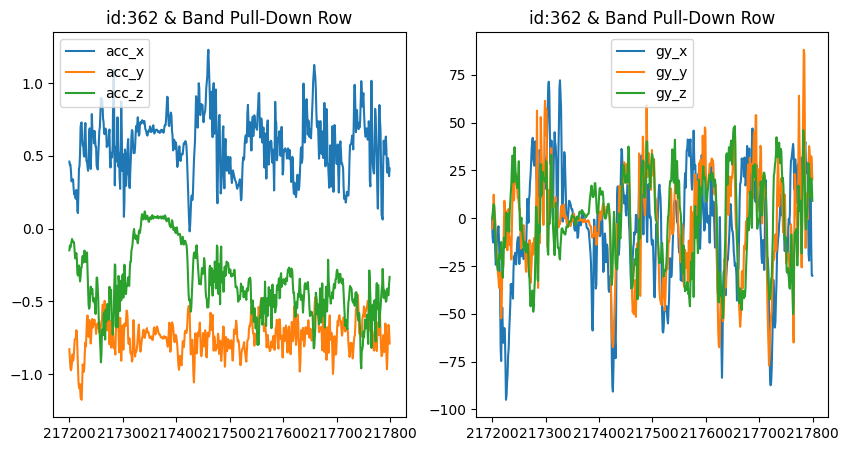

In [ ]:
# label 이 1인 경우

for i in [121,256,362]:

  fig = plt.figure(figsize=(10,5))
  ax1 = fig.add_subplot(1,2,1)
  ax2 = fig.add_subplot(1,2,2)

  train[train['id']==i].iloc[:,2:5].plot(ax=ax1)
  train[train['id']==i].iloc[:,5:].plot(ax=ax2)
  ax1.set_title('id:{0} & {1}'.format(i, train_labels[train_labels['id']==i]['label_desc'].values[0]))
  ax2.set_title('id:{0} & {1}'.format(i, train_labels[train_labels['id']==i]['label_desc'].values[0]))

  plt.show()
  print()


-----------------------------------------


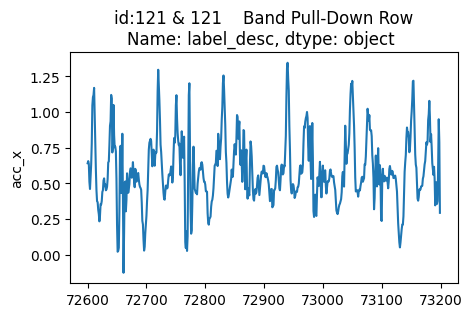

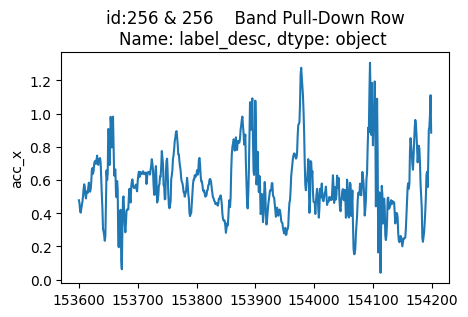

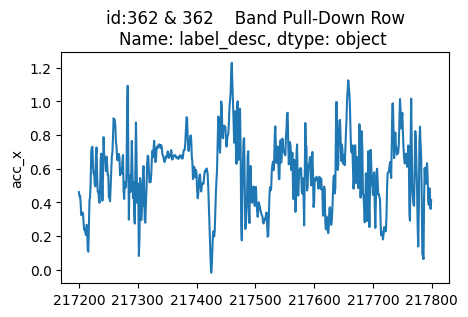

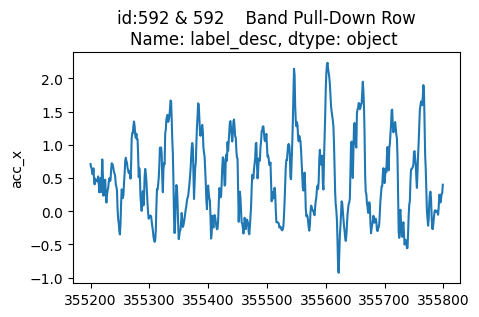

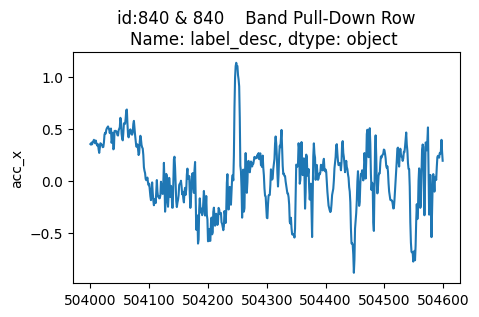


-----------------------------------------


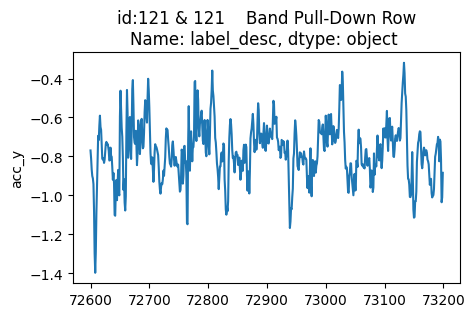

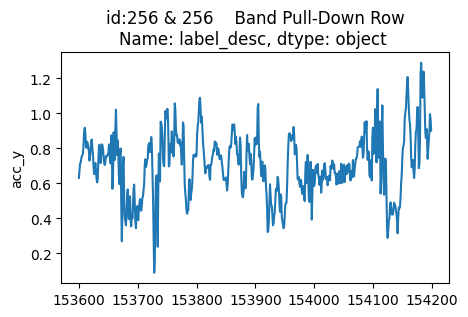

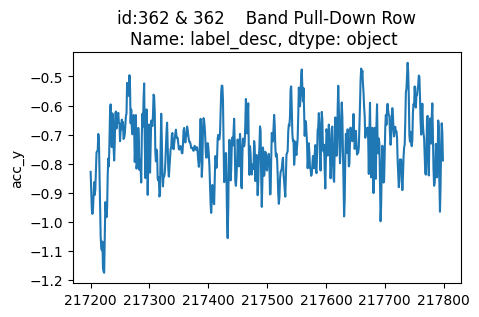

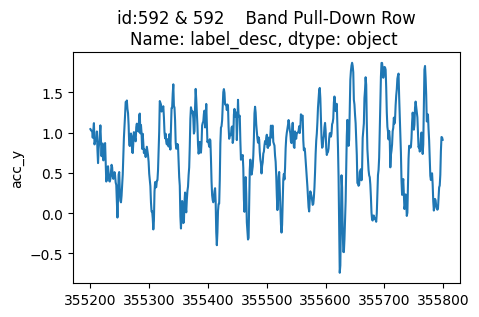

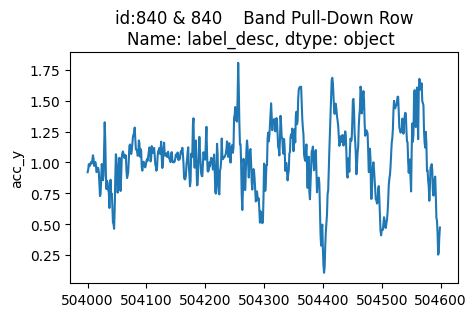


-----------------------------------------


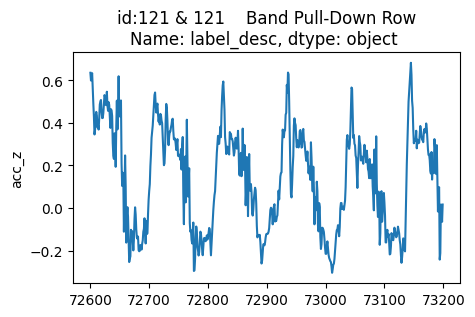

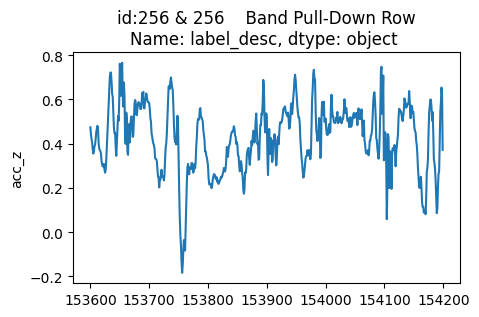

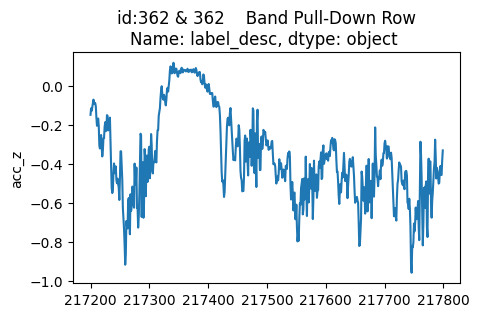

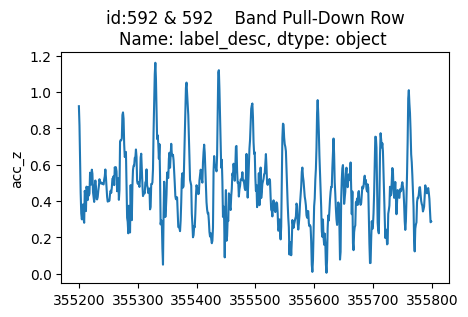

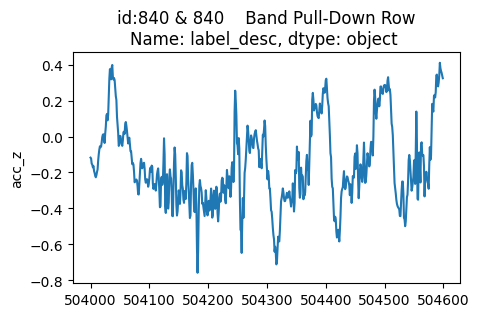


-----------------------------------------


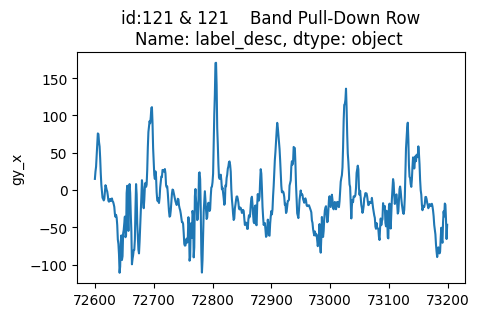

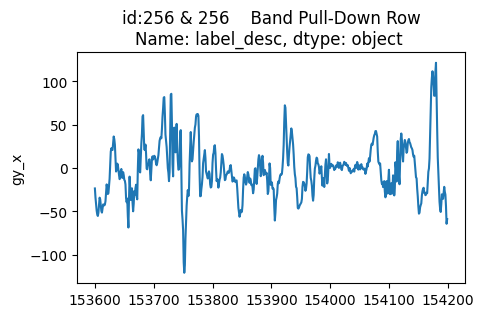

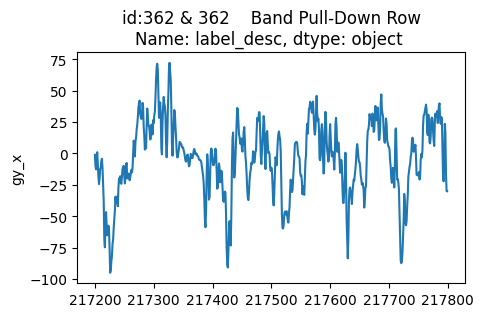

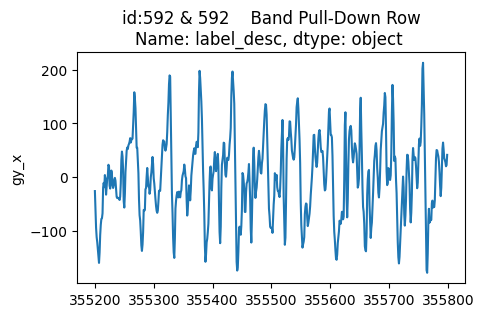

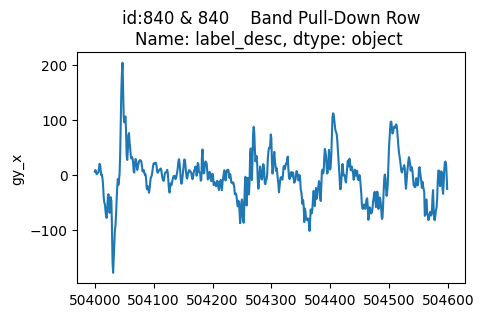


-----------------------------------------


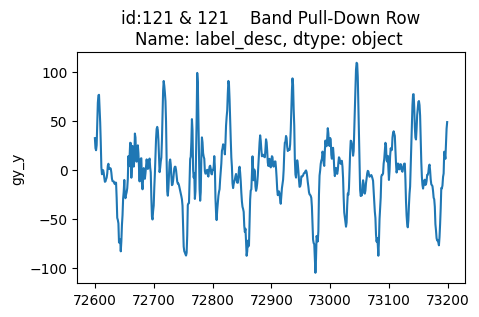

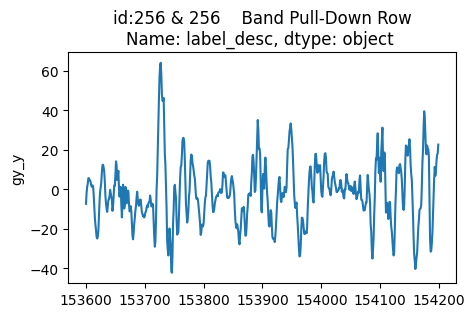

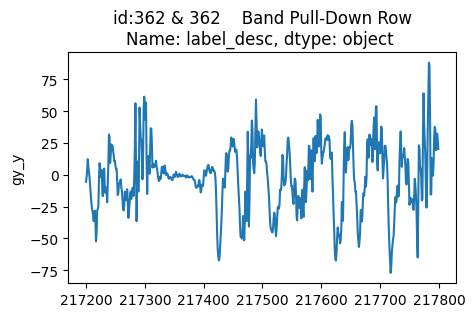

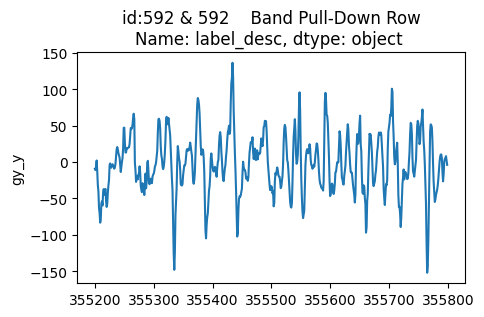

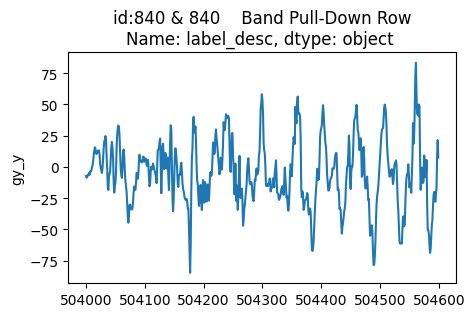


-----------------------------------------


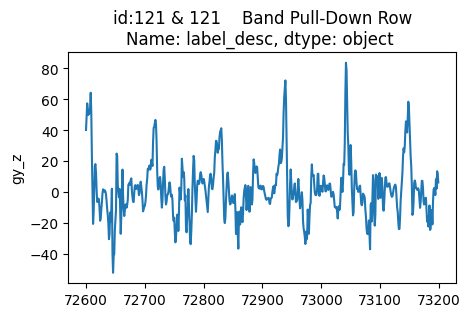

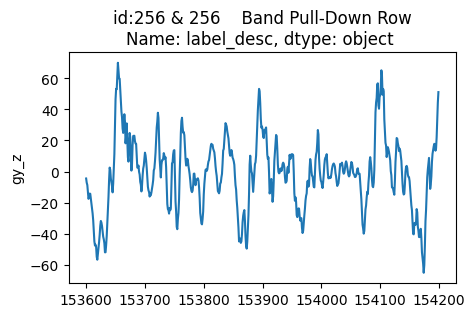

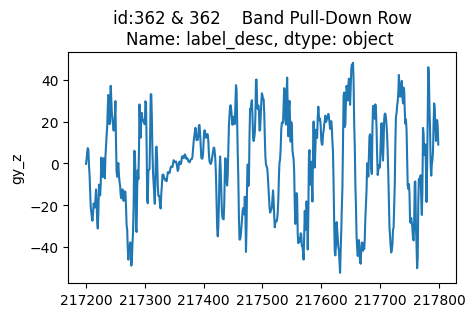

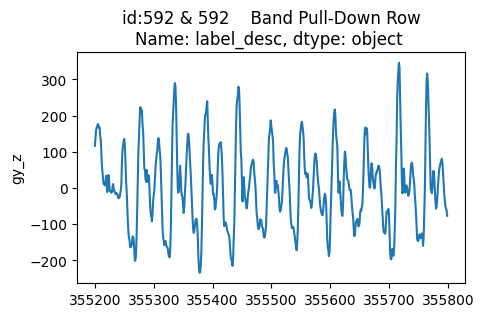

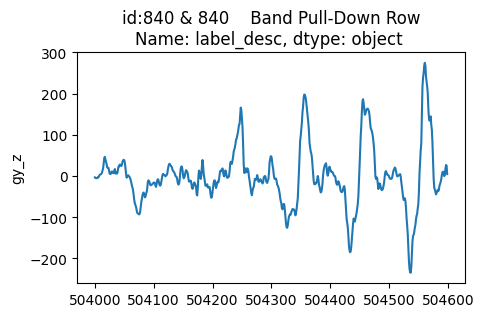

In [ ]:
# 각 축 별 따로 plot
for j in [2,3,4,5,6,7]:
  print('-----------------------------------------')
  for i in [121,256,362,592,840]:
    fig = plt.figure(figsize=(5,3))

    df1[df1['id']==i].iloc[:3000,j].plot()
    plt.title('id:{0} & {1} '.format(i, train_labels[train_labels['id']==i]['label_desc']))
    plt.ylabel(df1.columns[j])
    plt.show()
    print()

#### ex) label=10

In [ ]:
label10=train_labels[train_labels['label']==10].index
label10

Index([  95,  313,  408,  465,  497,  520,  918, 1184, 1218, 1342, 1495, 1505,
       1581, 1627, 2343, 2373, 2409, 2520, 2668, 2824],
      dtype='int64')

In [ ]:
df10 = pd.DataFrame(index=range(0,0), columns=['id', 'time', 'acc_x', 'acc_y', 'acc_z', 'gy_x', 'gy_y', 'gy_z'])
df10

for i in label10:
  df10= pd.concat([df10 , pd.DataFrame(train[train['id']==i])])

In [ ]:
df10

,id,time,acc_x,acc_y,acc_z,gy_x,gy_y,gy_z
57000,95,0,-0.933643,-0.339934,-0.223466,-3.986981,3.083932,8.157110
57001,95,1,-0.937044,-0.321514,-0.240940,-4.752811,3.227285,8.518709
57002,95,2,-0.938548,-0.315680,-0.253695,-7.858240,4.154957,8.247073
57003,95,3,-0.938603,-0.311944,-0.260889,-10.736117,3.974166,7.940738
57004,95,4,-0.931632,-0.318215,-0.254371,-12.059800,3.382769,7.791403
...,...,...,...,...,...,...,...,...
1694995,2824,595,-1.223538,-0.031188,-0.151168,6.844194,-14.232584,-2.524192
1694996,2824,596,-1.207081,-0.013474,-0.136237,1.878071,-14.557995,2.227607
1694997,2824,597,-1.147730,-0.000737,-0.165371,5.826460,-9.109830,8.557318
1694998,2824,598,-1.147546,0.004847,-0.188014,9.037712,-6.224225,9.238589


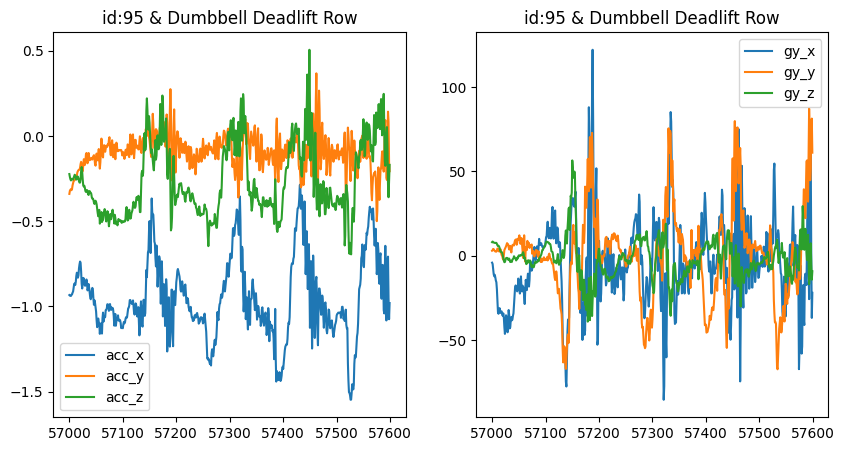

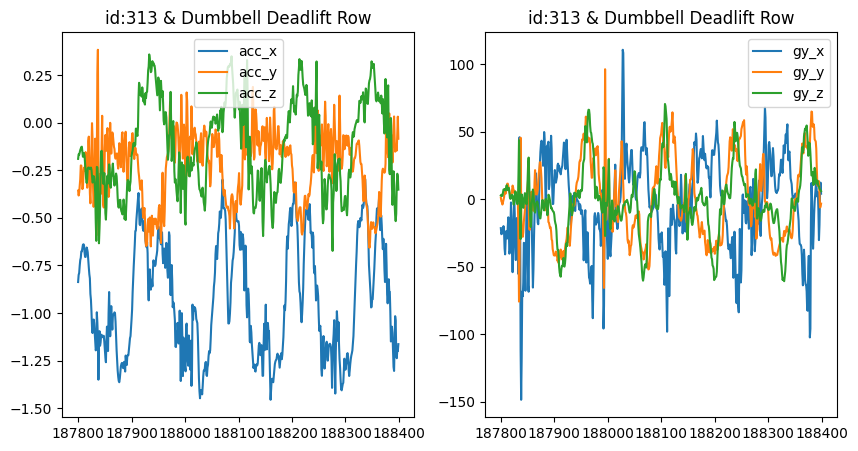

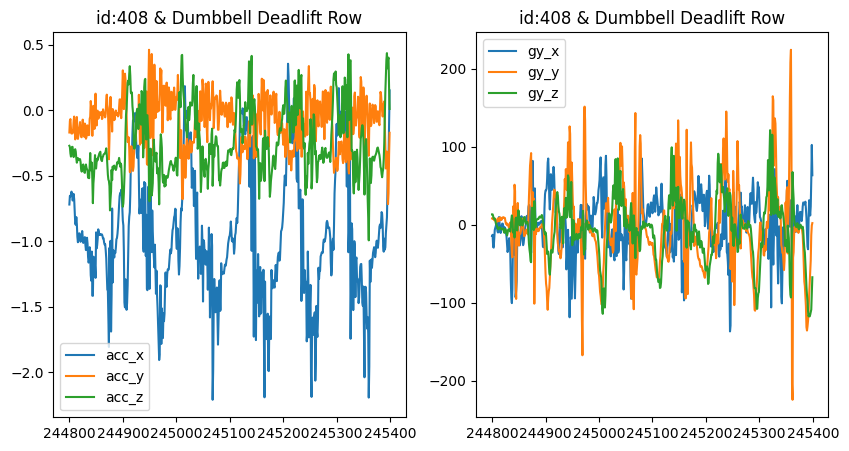

In [ ]:
# label 이 10인 경우

for i in [95,  313,  408] :

  fig = plt.figure(figsize=(10,5))
  ax1 = fig.add_subplot(1,2,1)
  ax2 = fig.add_subplot(1,2,2)

  train[train['id']==i].iloc[:,2:5].plot(ax=ax1)
  ax1.set_title('id:{0} & {1}'.format(i, train_labels[train_labels['id']==i]['label_desc'].values[0]))


  train[train['id']==i].iloc[:,5:].plot(ax=ax2)
  ax2.set_title('id:{0} & {1}'.format(i, train_labels[train_labels['id']==i]['label_desc'].values[0]))
  plt.show()
  print()

## 1-2 test

In [ ]:
test # id 782개

,id,time,acc_x,acc_y,acc_z,gy_x,gy_y,gy_z
0,3125,0,-0.628100,-0.160155,0.151487,49.665357,88.435961,13.597668
1,3125,1,-0.462548,0.012462,-0.053726,56.953059,96.185341,16.278458
2,3125,2,-0.363481,-0.091789,-0.130004,29.557396,93.836453,13.329043
3,3125,3,-0.351750,-0.239870,-0.193053,23.686172,88.608721,13.449771
4,3125,4,-0.312934,-0.123762,-0.318621,20.410071,85.327707,13.884912
...,...,...,...,...,...,...,...,...
469195,3906,595,0.104191,-0.784979,0.639513,-10.475346,14.095361,-190.358982
469196,3906,596,0.103297,-0.758954,0.615687,-25.360272,-8.523018,-180.393291
469197,3906,597,0.128294,-0.749389,0.586184,-27.917723,-23.186245,-162.624160
469198,3906,598,0.104130,-0.692731,0.573397,-27.847980,-30.407555,-138.761676


In [ ]:
test.describe()

,id,time,acc_x,acc_y,acc_z,gy_x,gy_y,gy_z
count,469200.000000,469200.000000,469200.000000,469200.000000,469200.000000,469200.000000,469200.000000,469200.000000
mean,3515.500000,299.500000,-0.450305,-0.188638,0.047377,-1.368040,-0.886681,0.524323
std,225.744011,173.205025,0.719705,0.572534,0.473548,63.273916,72.960652,70.565590
min,3125.000000,0.000000,-8.339774,-8.016826,-7.167801,-1148.067436,-1328.322686,-1288.723399
25%,3320.000000,149.750000,-0.966716,-0.533114,-0.212799,-20.988234,-19.548521,-15.295959
50%,3515.500000,299.500000,-0.659828,-0.227487,0.011947,-1.407126,-0.221448,-0.422151
75%,3711.000000,449.250000,-0.005081,0.117209,0.347686,15.552447,16.800463,15.370501
max,3906.000000,599.000000,8.173537,6.398895,7.517018,1260.580296,1761.286813,1066.225136


## 1-3 submission

In [ ]:
submission # 781개의 아이디 61개의 운동동작 중 어떤 것인지 분류(1)

,id,0,1,2,3,4,5,6,7,8,...,51,52,53,54,55,56,57,58,59,60
0,3125,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,3126,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,3127,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3128,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,3129,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
777,3902,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
778,3903,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
779,3904,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
780,3905,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# 2. EDA

## 2-1 새로운 변수


### vector
= sqrt( x^2+y^2+z^2 )

In [12]:
train.head()

,id,time,acc_x,acc_y,acc_z,gy_x,gy_y,gy_z
0,0,0,1.206087,-0.179371,-0.148447,-0.591608,-30.549010,-31.676112
1,0,1,1.287696,-0.198974,-0.182444,0.303100,-39.139103,-24.927216
2,0,2,1.304609,-0.195114,-0.253382,-3.617278,-44.122565,-25.019629
3,0,3,1.293095,-0.230366,-0.215210,2.712986,-53.597843,-27.454013
4,0,4,1.300887,-0.187757,-0.222523,4.286707,-57.906561,-27.961234


In [13]:
train['acc'] = (train['acc_x']**2 + train['acc_y']**2 + train['acc_z']**2)**0.5
test['acc'] = (test['acc_x']**2 + test['acc_y']**2 + test['acc_z']**2)**0.5

train['gy'] = (train['gy_x']**2 + train['gy_y']**2 + train['gy_z']**2)**0.5
test['gy'] = (test['gy_x']**2 + test['gy_y']**2 + test['gy_z']**2)**0.5

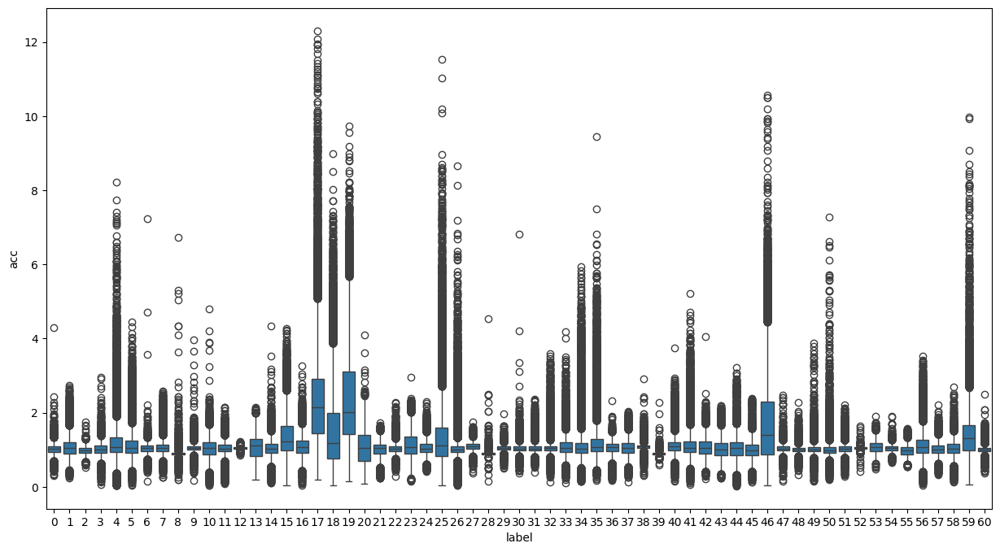

In [14]:
import seaborn as sns

plt.figure(figsize = (15,8))

sns.boxplot(x="label",

            y="acc",

            data=pd.merge(train,train_labels))

plt.show()

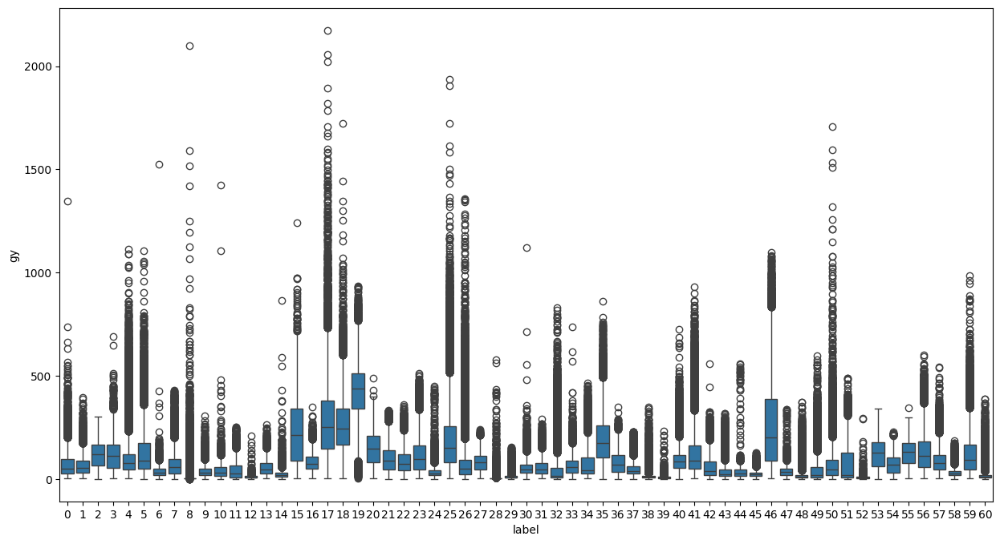

In [15]:
import seaborn as sns

plt.figure(figsize = (15,8))

sns.boxplot(x="label",

            y="gy",

            data=pd.merge(train,train_labels))

plt.show()

##### ex) label 17

In [16]:
train_labels[train_labels['label']==17].index

Index([  60,  129,  207,  367,  482,  499,  531,  886, 1017, 1042, 1045, 1390,
       1780, 1845, 1863, 1989, 2107, 2111, 2288, 2407, 2498, 2826, 2947, 2968,
       3047, 3110, 3119],
      dtype='int64')

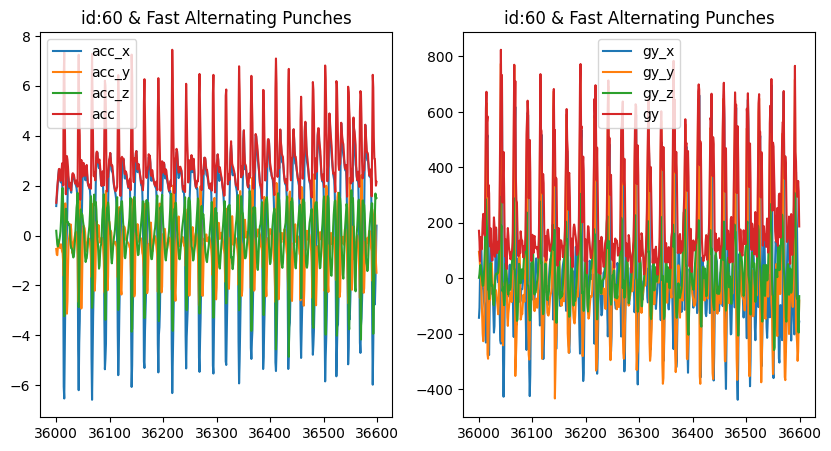

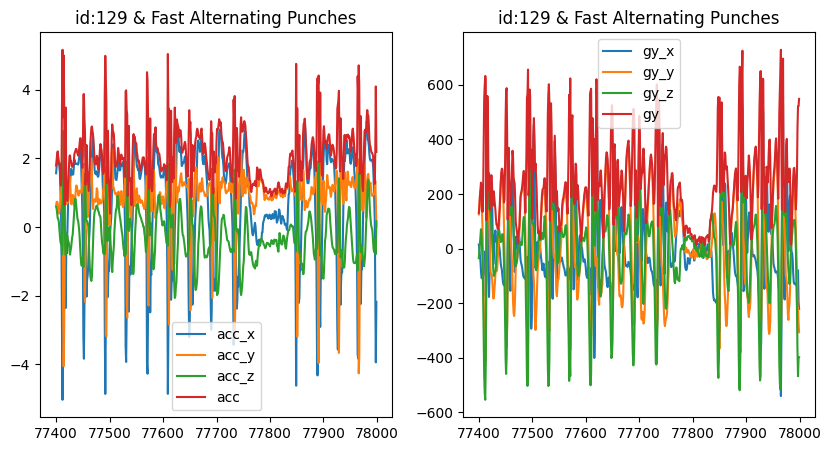

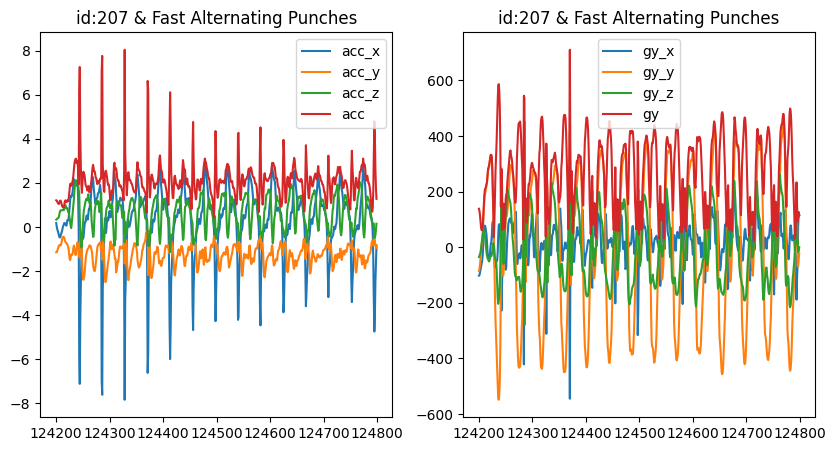

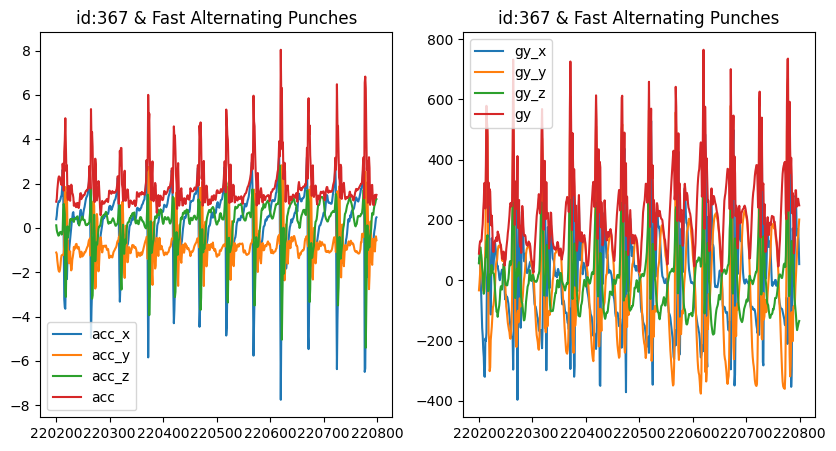

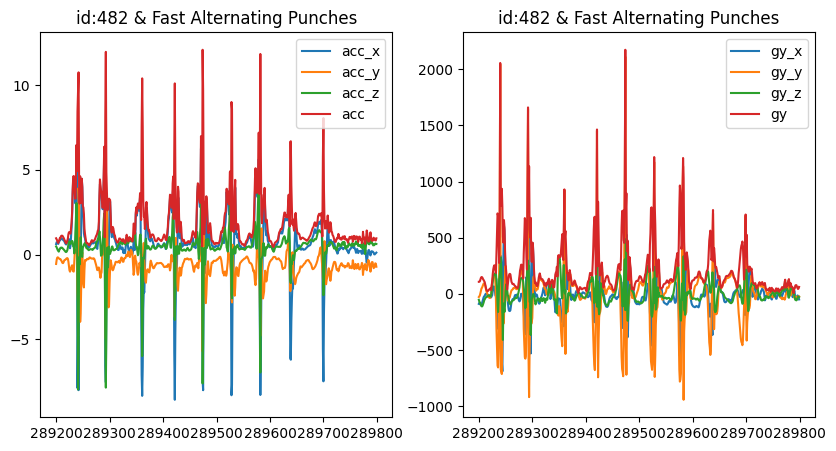

In [20]:
# label 이 17인 경우

for i in [60,  129,  207,  367,  482]:

  fig = plt.figure(figsize=(10,5))
  ax1 = fig.add_subplot(1,2,1)
  ax2 = fig.add_subplot(1,2,2)

  train[train['id']==i].iloc[:,[2,3,4,8]].plot(ax=ax1)
  train[train['id']==i].iloc[:,[5,6,7,9]].plot(ax=ax2)
  ax1.set_title('id:{0} & {1}'.format(i, train_labels[train_labels['id']==i]['label_desc'].values[0]))
  ax2.set_title('id:{0} & {1}'.format(i, train_labels[train_labels['id']==i]['label_desc'].values[0]))
  plt.show()
  print()

## 2-2 Scaling

In [21]:
train.iloc[:,2:]

,acc_x,acc_y,acc_z,gy_x,gy_y,gy_z,acc,gy
0,1.206087,-0.179371,-0.148447,-0.591608,-30.549010,-31.676112,1.228355,44.010999
1,1.287696,-0.198974,-0.182444,0.303100,-39.139103,-24.927216,1.315689,46.403958
2,1.304609,-0.195114,-0.253382,-3.617278,-44.122565,-25.019629,1.343234,50.851423
3,1.293095,-0.230366,-0.215210,2.712986,-53.597843,-27.454013,1.330969,60.281107
4,1.300887,-0.187757,-0.222523,4.286707,-57.906561,-27.961234,1.333070,64.446693
...,...,...,...,...,...,...,...,...
1874995,-0.712530,-0.658357,0.293707,-29.367857,-104.013664,-76.290437,1.013606,132.293402
1874996,-0.683037,-0.658466,0.329223,-30.149089,-101.796809,-76.625087,1.004243,130.931134
1874997,-0.664730,-0.666625,0.364114,-27.873095,-98.776072,-79.365125,1.009373,129.739912
1874998,-0.630534,-0.682565,0.373696,-23.636550,-99.139495,-80.259478,1.001557,129.726288


In [22]:
from sklearn.preprocessing import StandardScaler

In [23]:
scaler=StandardScaler()

train.iloc[:,2:]=scaler.fit_transform(train.iloc[:,2:])
test.iloc[:,2:]=scaler.fit_transform(test.iloc[:,2:])

In [24]:
train.head()

,id,time,acc_x,acc_y,acc_z,gy_x,gy_y,gy_z,acc,gy
0,0,0,2.307314,-0.029939,-0.432104,0.011776,-0.410859,-0.461007,0.386070,-0.348596
1,0,1,2.421086,-0.063321,-0.504058,0.026484,-0.528052,-0.365459,0.606254,-0.322359
2,0,2,2.444664,-0.056749,-0.654199,-0.037962,-0.596041,-0.366767,0.675697,-0.273597
3,0,3,2.428612,-0.116782,-0.573407,0.066099,-0.725311,-0.401232,0.644776,-0.170208
4,0,4,2.439475,-0.044220,-0.588886,0.091969,-0.784094,-0.408413,0.650073,-0.124536


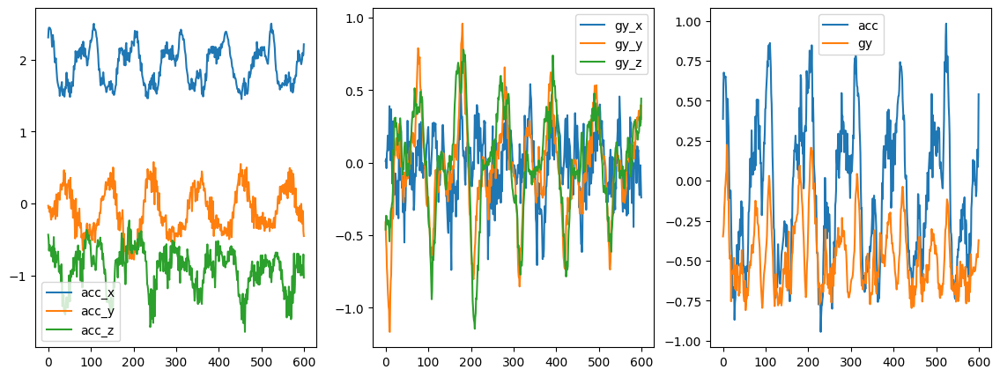

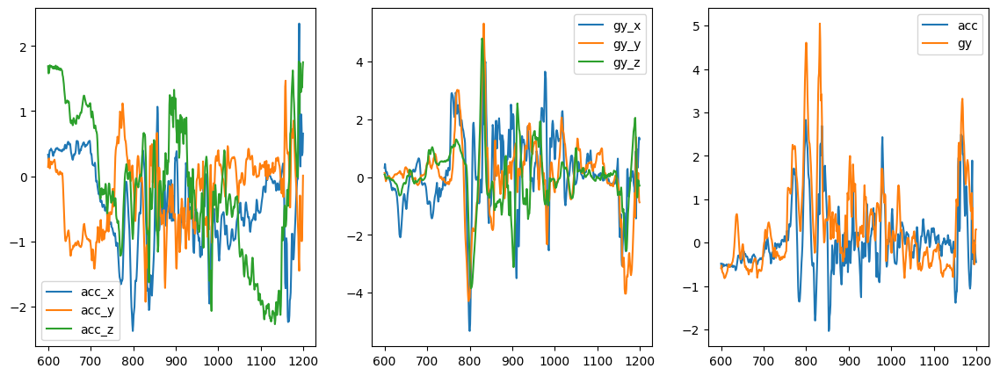

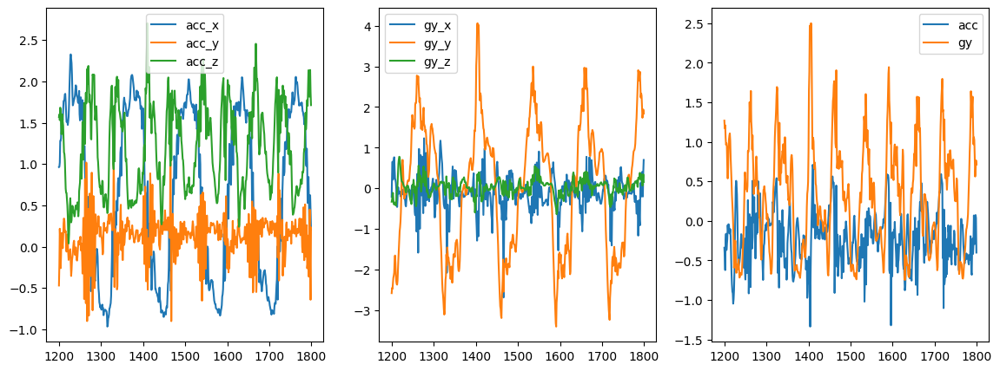

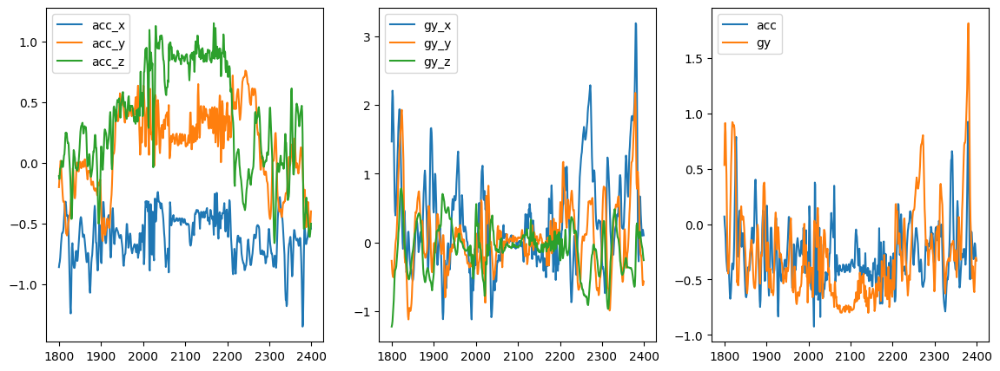

In [27]:
for i in range(0,4,1):

  fig = plt.figure(figsize=(14,5))
  ax1 = fig.add_subplot(1,3,1)
  ax2 = fig.add_subplot(1,3,2)
  ax3 = fig.add_subplot(1,3,3)

  # scaling 한 plot
  train[train['id']==i].iloc[:,[2,3,4]].plot(ax=ax1)
  train[train['id']==i].iloc[:,[5,6,7]].plot(ax=ax2)
  train[train['id']==i].iloc[:,[8,9]].plot(ax=ax3)
  plt.show()
  print()

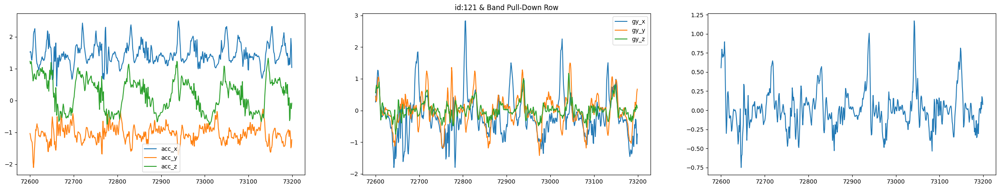

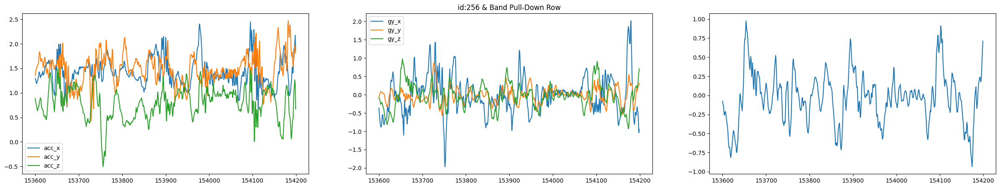

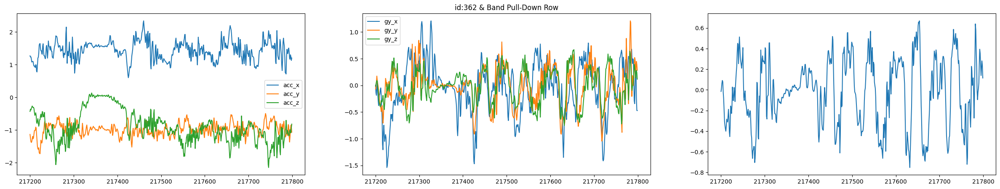

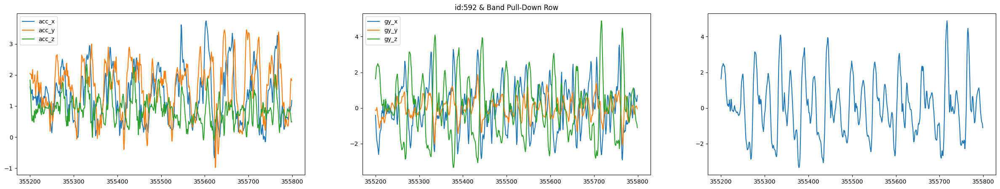

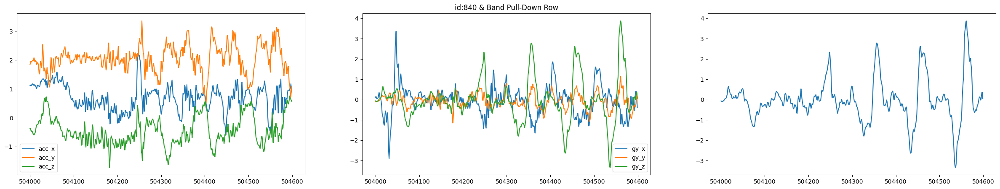

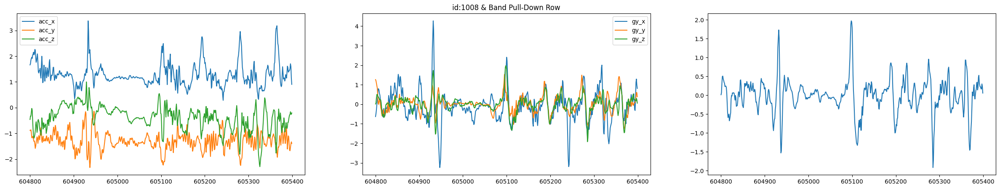

In [28]:
# label 1 :band - pull row
for i in [121,256,362,592,  840, 1008]:

  fig = plt.figure(figsize=(30,5))
  ax1 = fig.add_subplot(1,3,1)
  ax2 = fig.add_subplot(1,3,2)
  ax3 = fig.add_subplot(1,3,3)

  train[train['id']==i].iloc[:,2:5].plot(ax=ax1)
  train[train['id']==i].iloc[:,5:8].plot(ax=ax2)
  train[train['id']==i].iloc[:,7].plot(ax=ax3)
  ax2.set_title('id:{0} & {1}'.format(i, train_labels[train_labels['id']==i]['label_desc'].values[0]))
  plt.show()
  print()

In [29]:
train_labels[train_labels['label']==2]['id'].to_list()

[76,
 119,
 786,
 1324,
 1440,
 1468,
 1569,
 1612,
 1633,
 1647,
 1820,
 1869,
 1939,
 2021,
 2273,
 2406,
 2575,
 2935,
 3108,
 3124]

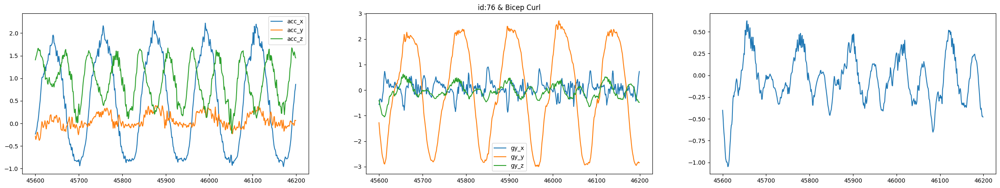

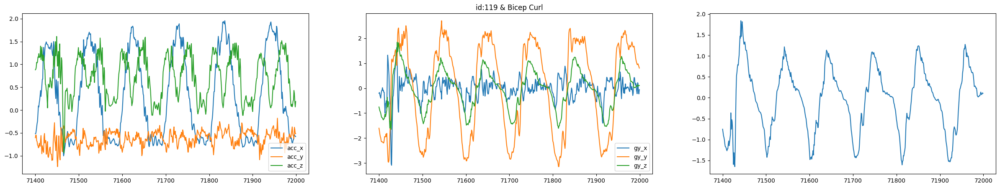

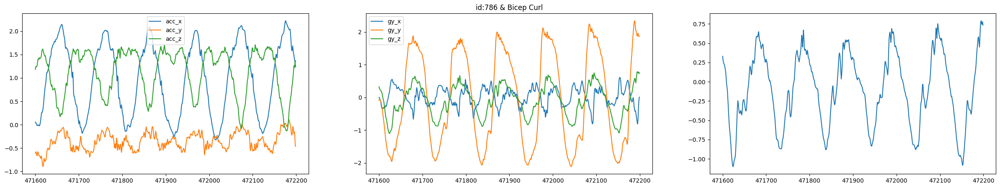

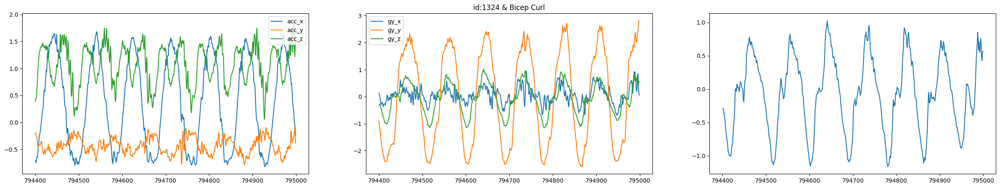

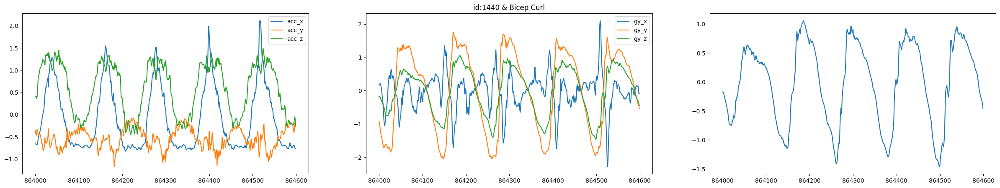

In [30]:
# label 2 :bicep curl
for i in [76,119,786,1324,1440]:

  fig = plt.figure(figsize=(30,5))
  ax1 = fig.add_subplot(1,3,1)
  ax2 = fig.add_subplot(1,3,2)
  ax3 = fig.add_subplot(1,3,3)

  train[train['id']==i].iloc[:,2:5].plot(ax=ax1)
  train[train['id']==i].iloc[:,5:8].plot(ax=ax2)
  train[train['id']==i].iloc[:,7].plot(ax=ax3)
  ax2.set_title('id:{0} & {1}'.format(i, train_labels[train_labels['id']==i]['label_desc'].values[0]))
  plt.show()
  print()

## 2-3 reshaping

convolution1d layer expect 3D input.
Batchsize x Width x Channels.

In [31]:
import tensorflow as tf

from keras.models import Sequential
from keras.layers import Dense,LSTM # LSTM

In [32]:
train.iloc[:,2:]

,acc_x,acc_y,acc_z,gy_x,gy_y,gy_z,acc,gy
0,2.307314,-0.029939,-0.432104,0.011776,-0.410859,-0.461007,0.386070,-0.348596
1,2.421086,-0.063321,-0.504058,0.026484,-0.528052,-0.365459,0.606254,-0.322359
2,2.444664,-0.056749,-0.654199,-0.037962,-0.596041,-0.366767,0.675697,-0.273597
3,2.428612,-0.116782,-0.573407,0.066099,-0.725311,-0.401232,0.644776,-0.170208
4,2.439475,-0.044220,-0.588886,0.091969,-0.784094,-0.408413,0.650073,-0.124536
...,...,...,...,...,...,...,...,...
1874995,-0.367432,-0.845648,0.503707,-0.461266,-1.413128,-1.092639,-0.155342,0.619348
1874996,-0.326315,-0.845833,0.578875,-0.474109,-1.382884,-1.097377,-0.178947,0.604411
1874997,-0.300794,-0.859728,0.652722,-0.436694,-1.341672,-1.136169,-0.166013,0.591351
1874998,-0.253120,-0.886873,0.673002,-0.367051,-1.346630,-1.148831,-0.185719,0.591201


In [33]:
np.array(train.iloc[:,2:])

array([[ 2.30731395, -0.02993881, -0.43210379, ..., -0.4610072 ,
         0.38607047, -0.34859632],
       [ 2.4210864 , -0.06332135, -0.50405798, ..., -0.36545902,
         0.60625353, -0.3223595 ],
       [ 2.44466434, -0.05674912, -0.65419852, ..., -0.36676736,
         0.67569728, -0.27359671],
       ...,
       [-0.30079408, -0.85972807,  0.65272173, ..., -1.13616922,
        -0.16601309,  0.59135061],
       [-0.25312047, -0.88687322,  0.67300217, ..., -1.14883112,
        -0.18571938,  0.59120123],
       [-0.18037304, -0.91696552,  0.69563447, ..., -1.15473132,
        -0.22445644,  0.59277211]])

In [34]:
train.iloc[:,2:].shape

(1875000, 8)

In [35]:
X = tf.reshape( np.array(train.iloc[:,2:]) , shape=[-1,600,8])
# -1 깊이 알아서 = 3125 id, 600행(600 time) 8열(8개 축 feature)

X: 3125 id 차원 , 600time 행 , 8 feature 열

In [36]:
X.shape

TensorShape([3125, 600, 8])

In [37]:
X

<tf.Tensor: shape=(3125, 600, 8), dtype=float64, numpy=
array([[[ 2.30731395, -0.02993881, -0.43210379, ..., -0.4610072 ,
          0.38607047, -0.34859632],
        [ 2.4210864 , -0.06332135, -0.50405798, ..., -0.36545902,
          0.60625353, -0.3223595 ],
        [ 2.44466434, -0.05674912, -0.65419852, ..., -0.36676736,
          0.67569728, -0.27359671],
        ...,
        [ 2.05575702, -0.11248977, -0.86824633, ...,  0.25548326,
          0.08477068, -0.47962031],
        [ 2.0639965 , -0.3849975 , -0.70599774, ...,  0.2795442 ,
          0.15461466, -0.42925939],
        [ 2.21261634, -0.45138645, -1.02856324, ...,  0.44223528,
          0.54014845, -0.37191852]],

       [[ 0.33064398,  0.14140239,  1.6908822 , ...,  0.09208015,
         -0.48211057, -0.58811931],
        [ 0.26767452,  0.24393001,  1.57986243, ...,  0.09996467,
         -0.5866535 , -0.52736027],
        [ 0.2676167 ,  0.2731228 ,  1.58803352, ...,  0.01551869,
         -0.57786249, -0.63249784],
        ...

In [38]:
y=tf.keras.utils.to_categorical(train_labels['label']) # 클래스 벡터 (정수)를 이진 클래스 행렬로 변환
y.shape

(3125, 61)

In [39]:
y

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.]], dtype=float32)

In [40]:
test_X = tf.reshape( np.array(test.iloc[:,2:]), [-1,600,8] )
test_X.shape

TensorShape([782, 600, 8])

# 3. Model

*CNN* 구조.    
https://jeongminhee99.tistory.com/121


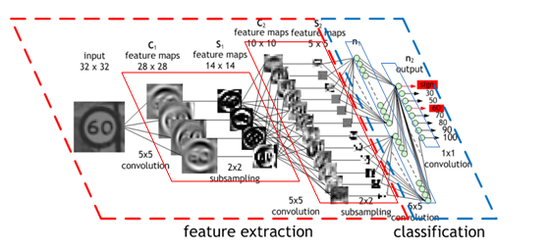

Convolution과 Pooling, Dense(또는 Fully Connected)라는 세가지 종류의 계층   



---


크게 Feature Extraction(특징 추출)과 Classification(분류) 2단계

* Feature Extraction(특징 추출) : 입력 데이터(input)의 고유한 특징을 찾아가는 단계
1. convultion layer
  - filters : 몇개의 filter
  - kernel_size : filter의 사이즈
  - strides : pixel 몇 간격씩 훑어나갈것인지
  - padding : zeropadding / valid=없음 same=있음
  - activation

2. pooling
3. fully connected layer / dense layer
  - flatten : 2차원을 1차원으로 바꾸는   
  Dense : 이전 계층의 모든 뉴런과 결합
  - Dropout : 무작위로 뉴런 집합 제거 - 과적합방지

*  Classification(분류): 찾은 특징들을 가지고 class를 고르는 단계






https://buomsoo-kim.github.io/keras/2018/05/02/Easy-deep-learning-with-Keras-8.md/



**<패딩>**   
-parameter 설정  
1) valid : 패딩 하지 않음, 차원 축소
2) same : 필터사이즈=k 이면 k/2 만큼 패딩. 차원 유지.
-패딩레이어   
zeropadding1d, 2d, 3d 등


**<필터/커널>**
* filters : 몇 개의 다른 종류의 필터를 활용할 것인지. 출력모양 깊이(depth) rufwjd
* kernel_size : 연산 수행시 윈도우 크기
* strides : 윈도우 한번에 얼마나 움직일지

**<풀링>**  
Max pooling : 최대값 추출
Average pooling : 평균값을 추출

Normalization
https://eehoeskrap.tistory.com/430
-> local optimum에 빠질 수 있기에

In [41]:
from tensorflow import keras
from keras import optimizers
from keras.models import Sequential
from keras.layers import Dense, LSTM, BatchNormalization, Conv1D, MaxPooling1D, Dropout, Flatten, Activation, Input, Layer
from sklearn.model_selection import StratifiedKFold

## (Repeated) Stratified Kfold


KFold 교차검증   

데이터를 k개의 분할(k개의 fold, 일반적으로 k=4 or 5)로 나누고 k개의 모델을 만들어 k-1개의 분할에서 훈련하고 나머지 분할에서 평가하는 방법이다. 모델의 검증 점수(score)는 k개의 검증 점수의 평균

kfold = https://www.dacon.io/competitions/official/235689/codeshare/2385?page=4&dtype=recent


Stratified KFold
불균형한 dataset 을 위한 kfold

stratifiedkfold = https://dacon.io/competitions/official/235689/codeshare/2396?page=3&dtype=recent


1D

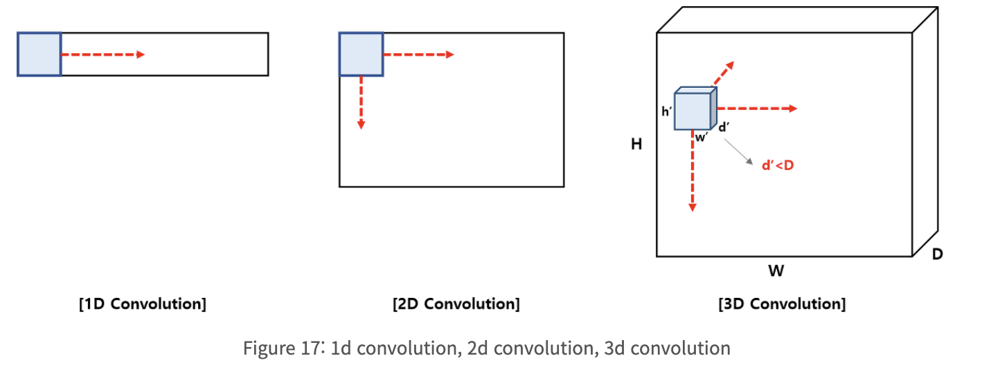

In [42]:
X.shape[1:]

TensorShape([600, 8])

### Model1 - 1D CNN Max Pooling

In [52]:
# 1DCNN

drop=0.2 # dropout 비율

def cnn_model():

  model = Sequential()

  #model.add(Input(shape=[600,8]))


  model.add(Conv1D( kernel_size=60, # 커널크기. # timestep을 얼마나 이동하면서 볼것인가
                     filters=256, # 아웃풋 공간의 차원. (아웃풀 필터 수)
                     strides=3, # kernel 얼마만큼 이동하면서 적용할 것인가. 간격 3칸
                     padding='valid', # 패딩 없음
                     kernel_initializer='he_uniform',
                     activation='relu',
                     input_shape=[600,8] ))
  model.add(BatchNormalization())
  model.add(MaxPooling1D(1,padding='valid')) # Pooling - 크기 줄이고 특정 feature 강조.
  # MaxPooling1D : 합성곱 연산에서 얻은 벡터에서 가장 큰 값을 가진 스칼라 값을 선택하여 feature 형성
  # CNN - 주로 max pooling (노이즈 감소, 속도 빨라짐,최대)
  model.add(Dropout(drop))

  model.add(Conv1D(kernel_size=60,
                     filters=128,
                     activation='relu'))
  model.add(BatchNormalization())
  model.add(MaxPooling1D(1,padding='valid'))
  model.add(Dropout(drop))

  model.add(Conv1D(kernel_size=60,
                     filters=64,
                     activation='relu'))
  model.add(BatchNormalization()) # 신경망 안에서 학습시 미니배치 평균과 분산을 조정하여 정규화.
  model.add(MaxPooling1D(1,padding='valid'))
  model.add(Dropout(drop))


  model.add(Flatten()) # CNN에서 Convolution Layer와 Pooling Layer -> 추출된 주요 특징은 2차원 데이터
  # Dense와 같이 분류를 위한 학습 레이어에서는 1차원 데이터로 바꾸어서 학습. #Flatten Layer가 2차원 데이터 -> 1차원 데이터로
  model.add(Dense(1024,activation='relu'))
  model.add(BatchNormalization())

  model.add(Dropout(drop))
  model.add(Dense(512,activation='relu'))
  model.add(BatchNormalization())

  model.add(Dropout(drop))
  model.add(Dense(61))
  model.add(Activation('softmax'))

  adam=keras.optimizers.Adam(learning_rate=0.001) # Adam = RMSProp + Momentum #lr 조정


  model.compile(optimizer=adam ,
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

  return model

In [53]:
cnn_model().summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_12 (Conv1D)          (None, 181, 256)          123136    
                                                                 
 batch_normalization_18 (Ba  (None, 181, 256)          1024      
 tchNormalization)                                               
                                                                 
 max_pooling1d_9 (MaxPoolin  (None, 181, 256)          0         
 g1D)                                                            
                                                                 
 dropout_17 (Dropout)        (None, 181, 256)          0         
                                                                 
 conv1d_13 (Conv1D)          (None, 122, 128)          1966208   
                                                                 
 batch_normalization_19 (Ba  (None, 122, 128)         

### GAP

In [54]:
from tensorflow.keras.layers import GlobalAveragePooling1D
# 1DCNN

drop=0.2 # dropout 비율

def cnn_model2():

  model = Sequential()

  #model.add(Rolling()) #데이터 증강 layer


  model.add(Conv1D( kernel_size=60, # 커널크기. # timestep을 얼마나 이동하면서 볼것인가
                     filters=256, # 아웃풋 공간의 차원. (아웃풀 필터 수)
                     strides=3, # kernel 얼마만큼 이동하면서 적용할 것인가. 간격 3칸
                     padding='valid', # 패딩 없음
                     kernel_initializer='he_uniform',
                     activation='relu',
                    input_shape=[600,8]))
  model.add(BatchNormalization())
  #model.add(MaxPooling1D(1,padding='valid')) # Pooling - 크기 줄이고 특정 feature 강조.
  # MaxPooling1D : 합성곱 연산에서 얻은 벡터에서 가장 큰 값을 가진 스칼라 값을 선택하여 feature 형성
  # CNN - 주로 max pooling (노이즈 감소 속도 빨라짐,최대)
  model.add(Dropout(drop))

  model.add(Conv1D(kernel_size=60,
                     filters=128,
                     activation='relu'))
  model.add(BatchNormalization())
  #model.add(MaxPooling1D(1,padding='valid'))
  model.add(Dropout(drop))

  model.add(Conv1D(kernel_size=60,
                     filters=64,
                     activation='relu'))
  model.add(BatchNormalization()) #신경망 안에서 학습시 미니배치 평균과 분산을 조정하여 정규화.
  # you should still standardize your inputs to a network that uses Batch Normalization.
  # This will ensure that inputs to the first layer have zero mean and come from the same distribution,
  # while Batch Normalization on subsequent layers will ensure that
  # inputs to those layers have zero mean in expectation
  # and that their distributions do not drift over time.


  #model.add(MaxPooling1D(1,padding='valid'))
  #model.add(Dropout(drop))



  # Flatten 대신 GAP으로 1차원 벡터로 만든다. 최대값 말고 평균값을 취하는 방법
  model.add(GlobalAveragePooling1D())

  #model.add(Flatten()) # CNN에서 Convolution Layer와 Pooling Layer -> 추출된 주요 특징은 2차원 데이터
  # Dense와 같이 분류를 위한 학습 레이어에서는 1차원 데이터로 바꾸어서 학습. #Flatten Layer가 2차원 데이터 -> 1차원 데이터로

  model.add(Dense(61))
  model.add(Activation('softmax'))

  adam=keras.optimizers.Adam(learning_rate=0.001) # Adam = RMSProp + Momentum #lr 조정


  model.compile(optimizer=adam ,
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

  return model

Flatten과 GAP MP 차이
https://koreapy.tistory.com/916

Flatten : 모든 모양의 텐서를 가져와 1차원 텐서로 변환.


In [55]:
cnn_model2().summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_15 (Conv1D)          (None, 181, 256)          123136    
                                                                 
 batch_normalization_23 (Ba  (None, 181, 256)          1024      
 tchNormalization)                                               
                                                                 
 dropout_22 (Dropout)        (None, 181, 256)          0         
                                                                 
 conv1d_16 (Conv1D)          (None, 122, 128)          1966208   
                                                                 
 batch_normalization_24 (Ba  (None, 122, 128)          512       
 tchNormalization)                                               
                                                                 
 dropout_23 (Dropout)        (None, 122, 128)         

## Kfold

### *

In [56]:
X=np.array(X)

In [57]:
from keras.callbacks import EarlyStopping
skf = StratifiedKFold(n_splits=5,random_state=2022,shuffle=True)
es=EarlyStopping(monitor='val_loss',patience=8,mode='min')

accuracy=[]
losss=[]
models=[]

for i,(train,validation) in enumerate(skf.split(X, y.argmax(1))):


  model = cnn_model()
  history=model.fit(X[train],y[train],
                    epochs=50,
                    validation_data=(X[validation],y[validation]),
                    verbose=2,
                    batch_size=64,
                    callbacks=es)

  accuracy.append(model.evaluate(X[validation],y[validation])[1])
  losss.append(model.evaluate(X[validation],y[validation])[0])
  models.append(model)

print(accuracy)
print(losss)

Epoch 1/50
40/40 - 136s - loss: 2.8196 - accuracy: 0.4348 - val_loss: 85.5494 - val_accuracy: 0.0464 - 136s/epoch - 3s/step
Epoch 2/50
40/40 - 127s - loss: 2.0728 - accuracy: 0.5388 - val_loss: 11.9645 - val_accuracy: 0.1664 - 127s/epoch - 3s/step
Epoch 3/50
40/40 - 127s - loss: 1.7262 - accuracy: 0.5648 - val_loss: 3.1340 - val_accuracy: 0.4816 - 127s/epoch - 3s/step
Epoch 4/50
40/40 - 129s - loss: 1.6682 - accuracy: 0.5764 - val_loss: 4.3504 - val_accuracy: 0.4096 - 129s/epoch - 3s/step
Epoch 5/50
40/40 - 127s - loss: 1.6137 - accuracy: 0.5880 - val_loss: 2.4661 - val_accuracy: 0.4832 - 127s/epoch - 3s/step
Epoch 6/50
40/40 - 129s - loss: 1.5638 - accuracy: 0.5992 - val_loss: 2.7858 - val_accuracy: 0.4544 - 129s/epoch - 3s/step
Epoch 7/50
40/40 - 129s - loss: 1.4443 - accuracy: 0.6140 - val_loss: 2.6181 - val_accuracy: 0.4496 - 129s/epoch - 3s/step
Epoch 8/50
40/40 - 126s - loss: 1.3257 - accuracy: 0.6392 - val_loss: 2.1943 - val_accuracy: 0.5536 - 126s/epoch - 3s/step
Epoch 9/50
40/

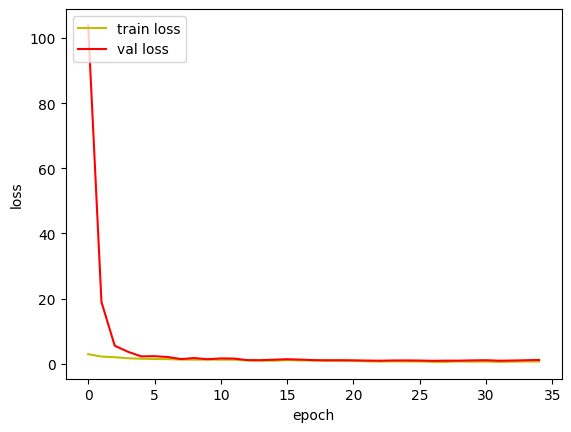

In [58]:
figs, loss_ax = plt.subplots()
loss_ax.plot(history.history['loss'],'y',label='train loss')
loss_ax.plot(history.history['val_loss'],'r',label='val loss')

loss_ax.legend(loc='upper left')
loss_ax.set_xlabel('epoch')
loss_ax.set_ylabel('loss')

plt.show()

In [59]:
print(sum([float(i) for i in accuracy])/5)
print()
print(sum([float(i) for i in losss])/5)

0.7247999906539917

1.1089833855628968


- epoch=30

acc 0.7260799884796143

loss 1.0452192425727844

- epoch50 _ feature8 nolstm no augmentation.   

0.7443199992179871

1.033057785034179

In [ ]:
X=np.array(X)

In [ ]:
from keras.callbacks import EarlyStopping
skf = StratifiedKFold(n_splits=5,random_state=2022,shuffle=True)
es=EarlyStopping(monitor='val_loss',patience=8,mode='min')

accuracy=[]
losss=[]
models=[]


for i,(train,validation) in enumerate(skf.split(X, y.argmax(1))):

  model = cnn_model2()
  history=model.fit(X[train],y[train],
                    epochs=50,
                    validation_data=(X[validation],y[validation]),
                    verbose=2,
                    batch_size=64,
                    callbacks=es)

  accuracy.append(model.evaluate(X[validation],y[validation])[1])
  losss.append(model.evaluate(X[validation],y[validation])[0])
  models.append(model)

print(accuracy)
print(losss)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/50
40/40 - 100s - loss: 2.8058 - accuracy: 0.4512 - val_loss: 8.1576 - val_accuracy: 0.0704 - 100s/epoch - 2s/step
Epoch 2/50
40/40 - 97s - loss: 2.0305 - accuracy: 0.5636 - val_loss: 2.9183 - val_accuracy: 0.4320 - 97s/epoch - 2s/step
Epoch 3/50
40/40 - 97s - loss: 1.6410 - accuracy: 0.6180 - val_loss: 1.9886 - val_accuracy: 0.5632 - 97s/epoch - 2s/step
Epoch 4/50
40/40 - 97s - loss: 1.5643 - accuracy: 0.6320 - val_loss: 1.7186 - val_accuracy: 0.6128 - 97s/epoch - 2s/step
Epoch 5/50
40/40 - 96s - loss: 1.3448 - accuracy: 0.6704 - val_loss: 1.4173 - val_accuracy: 0.6464 - 96s/epoch - 2s/step
Epoch 6/50
40/40 - 96s - loss: 1.1564 - accuracy: 0.6932 - val_loss: 1.1573 - val_accuracy: 0.7152 - 96s/epoch - 2s/step
Epoch 7/50
40/40 - 97s - loss: 1.0590 - accuracy: 0.7124 - val_loss: 1.1249 - val_accuracy: 0.7264 - 97s/epoch - 2s/step
Epoch 8/50
40/40 - 96s - loss: 1.0149 - accuracy: 0.7280 - val_loss: 1.0825 - val_accuracy: 0.7280 - 96s/epoch - 2s/step
Epoch 9/50
40/40 - 96s - loss:

- maxpooling1d   
[0.8032000064849854, 0.795199990272522, 0.7423999905586243, 0.795199990272522, 0.7712000012397766]   
[0.7877733111381531, 0.8139860033988953, 0.9403316378593445, 0.8125155568122864, 0.8452863097190857]   



- maxpooling1d 없이 globalaveragepooling     
[0.8032000064849854, 0.7824000120162964, 0.7824000120162964, 0.7888000011444092, 0.7680000066757202]  
[0.7609390616416931, 0.8555821180343628, 0.8638498187065125, 0.811896800994873, 0.8591187596321106]   


In [ ]:
print(sum([float(i) for i in accuracy])/5)
print()
print(sum([float(i) for i in losss])/5)

0.7849600076675415

0.8302773118019104


- epoch50 _ feature8 nolstm no augmentation. GAP 사용    

0.781439995765686

0.839978563785553


- epoch50 _ feature8 nolstm no augmentation. Max pooling 없이 GAP 사용   


0.7849600076675415

0.8302773118019104

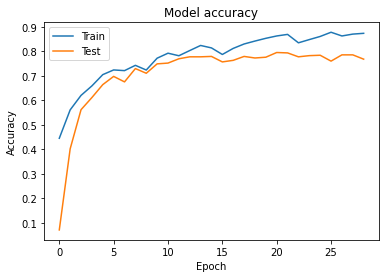

In [ ]:
#accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

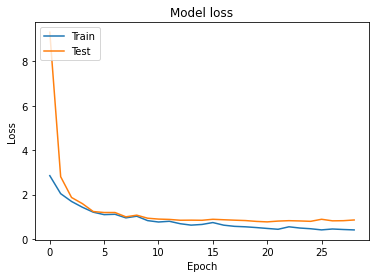

In [ ]:
#loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
test_X = tf.reshape( np.array(test.iloc[:,2:]) , shape=[-1,600,8])
# -1 깊이 알아서 = 3125 id, 600행(600 time) 6열(6개 축 feature)
test_X.shape

TensorShape([782, 600, 8])

In [ ]:
preds=[]
for model in models:
  pred = model.predict(test_X)
  preds.append(pred)

pred=np.mean(preds,axis=0)
pred

array([[3.4248445e-05, 5.5816265e-05, 1.7192264e-04, ..., 9.8186314e-02,
        1.9733992e-04, 4.9000955e-04],
       [2.3491259e-04, 2.3817974e-04, 1.8720400e-05, ..., 4.3423868e-05,
        6.0636310e-05, 8.4660586e-04],
       [1.0002600e-04, 2.9175591e-02, 1.8502154e-05, ..., 5.3099834e-04,
        4.7912938e-04, 2.1560428e-04],
       ...,
       [8.3514751e-04, 3.0412737e-05, 2.1435895e-05, ..., 6.6624975e-06,
        2.7071853e-06, 5.1679107e-04],
       [1.2907853e-04, 1.4447229e-03, 2.8027938e-04, ..., 3.2531047e-05,
        7.2138070e-04, 4.7962862e-06],
       [2.1449963e-05, 4.2860524e-06, 2.5568902e-06, ..., 1.0185264e-06,
        2.0645728e-06, 2.7933653e-05]], dtype=float32)

In [ ]:
submission.iloc[:,1:]=pred
submission
submission.to_csv('cnn0330_50epoch_nomax_GAPver.csv',index=False)